In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

MessageError: Error: credential propagation was unsuccessful

Read the data from drive and save is as dicitionary with each participant data seperately in it

In [ ]:

# Step 2: Set the path to your data file
file_path = '/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv'

# Step 3: Read the data using pandas
import pandas as pd
data2 = pd.read_csv(file_path)

# Display the first few rows of the dataframe to verify it was loaded correctly
#print(data.head())

# Assuming your data has an 'id' column for participant IDs and a 'timestamp' column for dates
# Convert the 'timestamp' column to datetime if it's not already
data2['Time'] = pd.to_datetime(data2['Time'])

# Step 4: Group the data by 'id'
grouped_data = data2.groupby('Id')

# Step 5: Create a dictionary to store dataframes for each participant
participant_data = {}

for participant_id, group in grouped_data:
    # Sort the data by timestamp for each participant
    group = group.sort_values(by='Time')
    participant_data[participant_id] = group

# Now participant_data is a dictionary where keys are participant IDs
# and values are dataframes with the corresponding participant's data

# Loop through each participant and print their data
for participant_id in participant_data.keys():
    print(f"Data for participant {participant_id}:")
    print(participant_data[participant_id])
    print()

Data for participant 2022484408:
                Id                Time  Value
0       2022484408 2016-04-12 07:21:00     97
1       2022484408 2016-04-12 07:21:05    102
2       2022484408 2016-04-12 07:21:10    105
3       2022484408 2016-04-12 07:21:20    103
4       2022484408 2016-04-12 07:21:25    101
...            ...                 ...    ...
154099  2022484408 2016-05-12 15:47:25     71
154100  2022484408 2016-05-12 15:47:30     71
154101  2022484408 2016-05-12 15:47:45     71
154102  2022484408 2016-05-12 15:47:50     70
154103  2022484408 2016-05-12 15:48:05     71

[154104 rows x 3 columns]

Data for participant 2026352035:
                Id                Time  Value
154104  2026352035 2016-04-17 05:30:20     70
154105  2026352035 2016-04-17 05:30:30     66
154106  2026352035 2016-04-17 05:30:40     67
154107  2026352035 2016-04-17 05:30:55     67
154108  2026352035 2016-04-17 05:31:10     67
...            ...                 ...    ...
156589  2026352035 2016-05-09 19

Write a function to read the data and save it as a dicitionary from a file_path in drive and plot it based on date(y axis) and Value (heart rate, steps,..) on x axis  

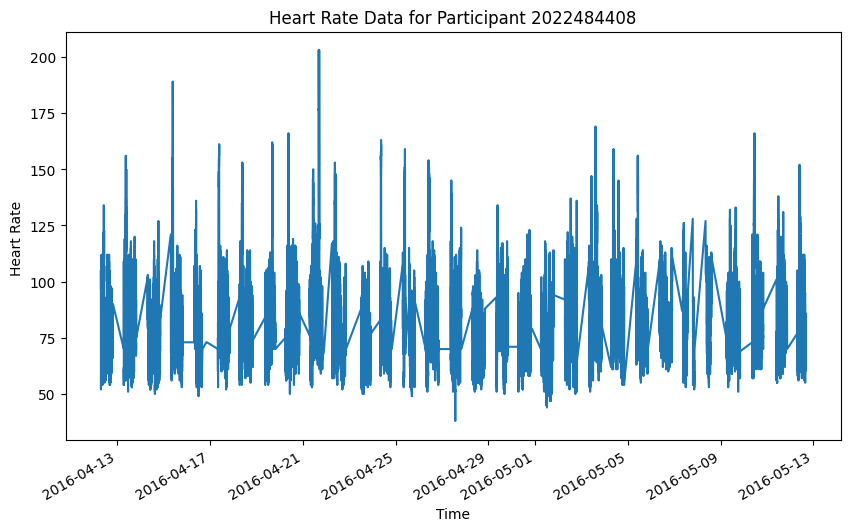

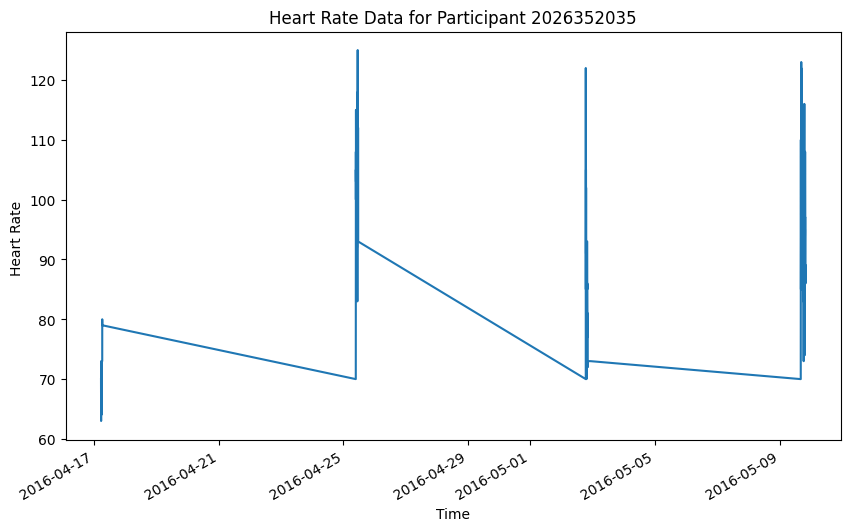

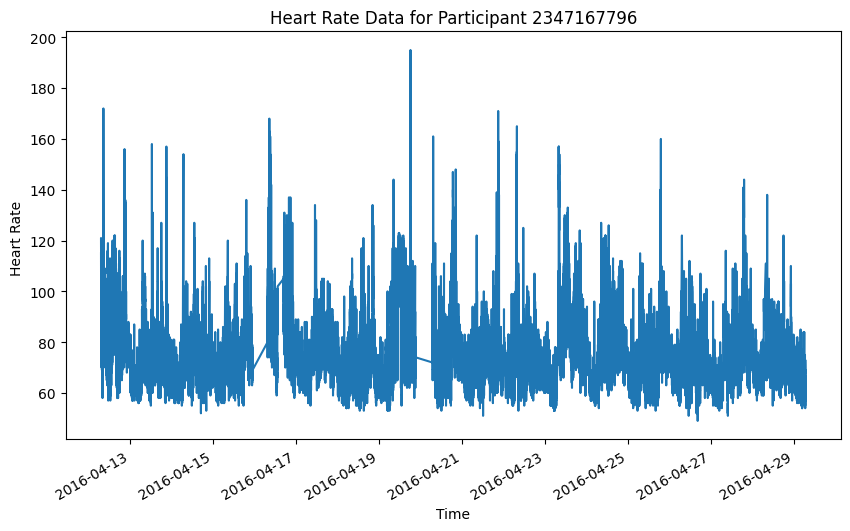

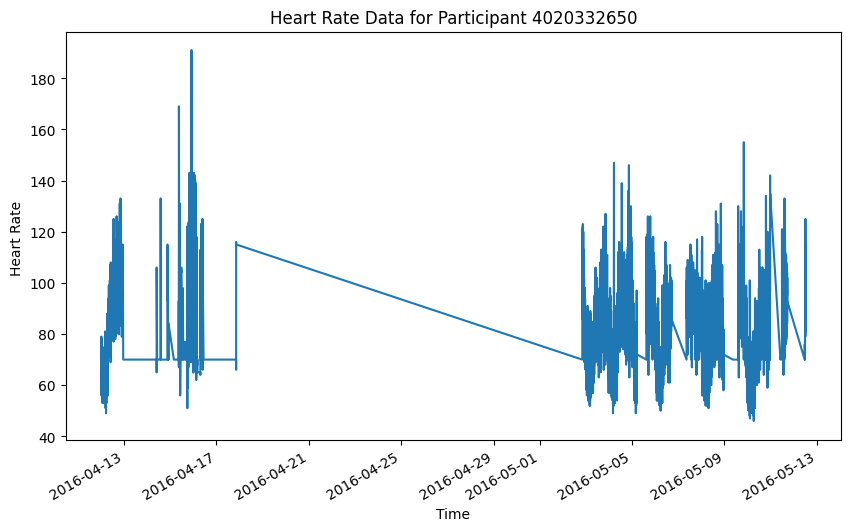

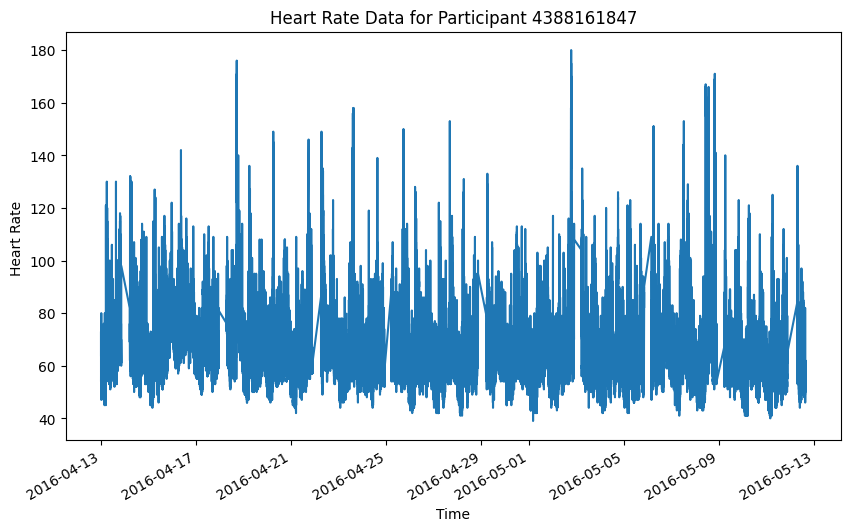

...

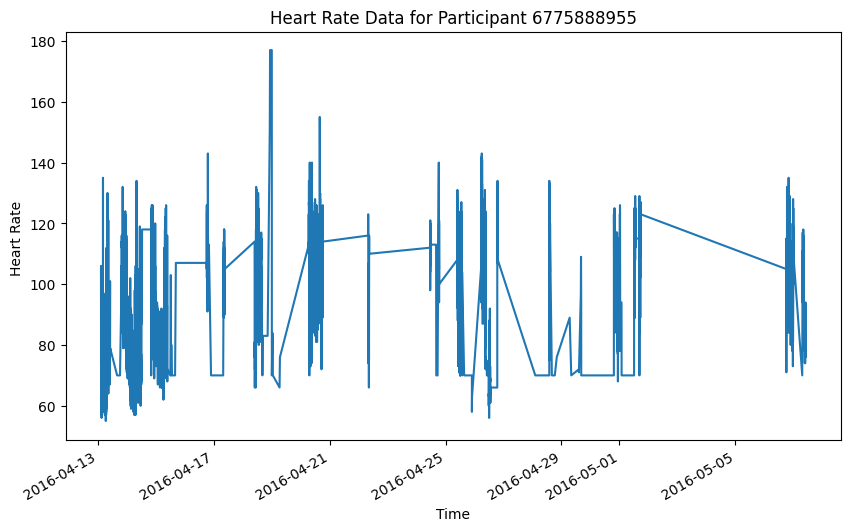

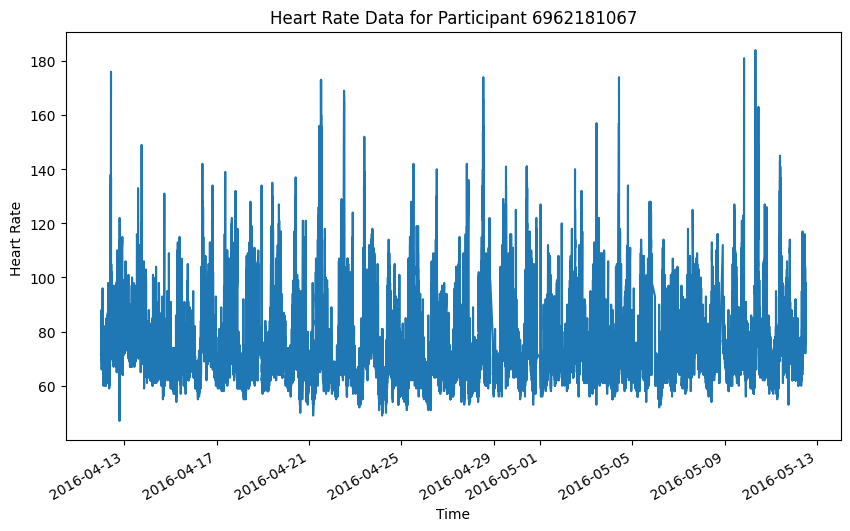

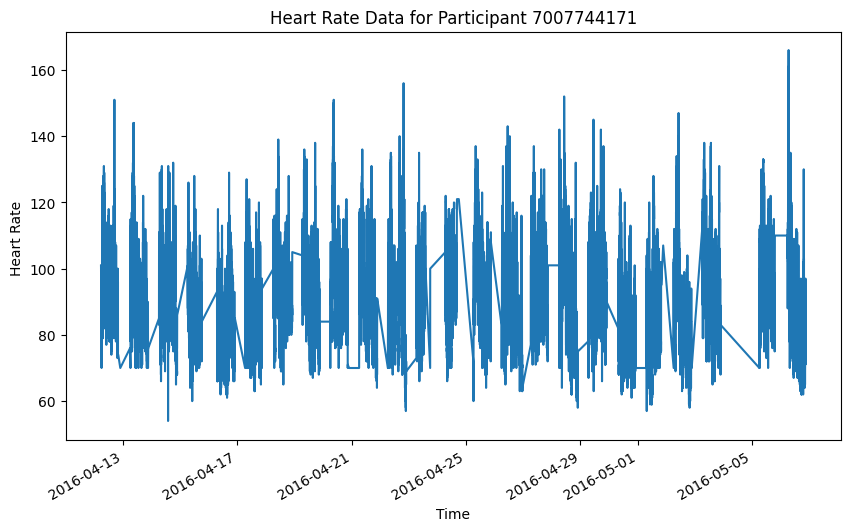

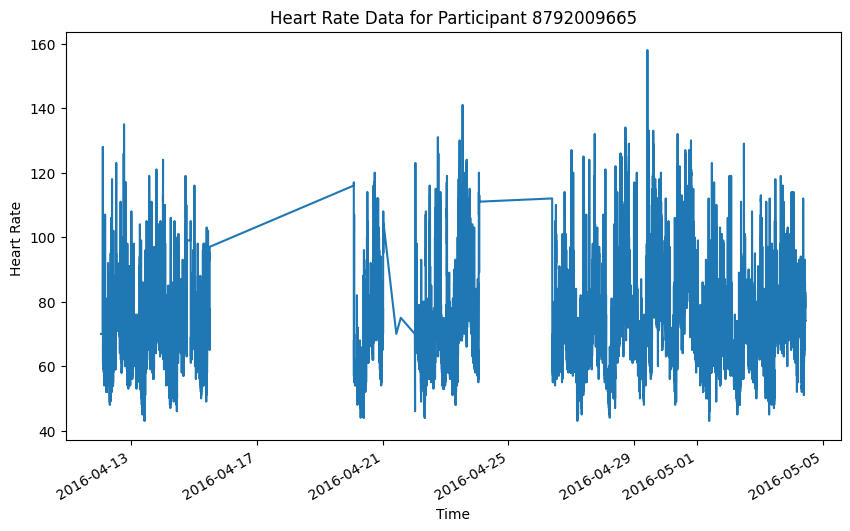

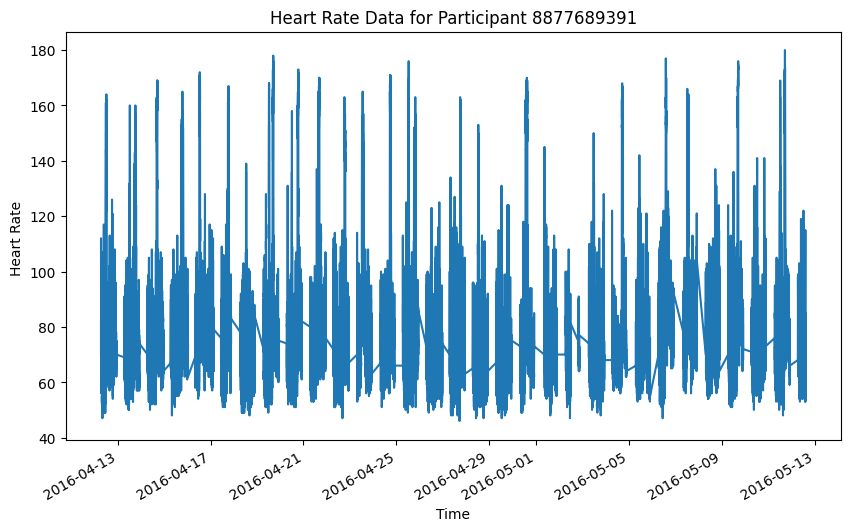

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def prepare_data(file_path):
    # Read the data from file
    df = pd.read_csv(file_path)

    # Convert 'Time' column to datetime
    df['Time'] = pd.to_datetime(df['Time'])

    # Initialize a dictionary to store DataFrames for each participant
    participant_data = {}

    # Loop through each unique participant ID
    for participant_id in df['Id'].unique():
        # Filter data for the current participant
        participant_df = df[df['Id'] == participant_id].copy()

        # Set 'Time' as the index
        participant_df.set_index('Time', inplace=True)

        # Store the DataFrame in the dictionary
        participant_data[participant_id] = participant_df

    return participant_data

def plot_participant_data(participant_data):
    # Plot data for all participants separately
    for pid, data in participant_data.items():
        data['Value'].plot(figsize=(10, 6))
        plt.title(f'Heart Rate Data for Participant {pid}')
        plt.xlabel('Time')
        plt.ylabel('Heart Rate ')
        plt.show()

# Example usage
file_path = "/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Plot data for all participants in separate plots
plot_participant_data(participant_data)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Plot data on a specific date and time

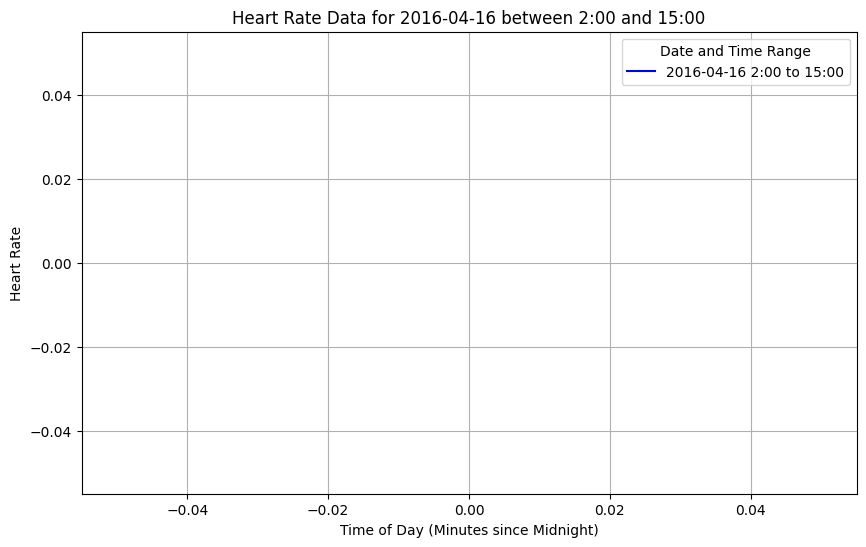

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'participant_data' is your DataFrame with heart rate data and 'timestamp' as index
id = 2347167796
df = participant_data[id]

# Convert the index to a DatetimeIndex
df.index = pd.to_datetime(df.index)

# Filter the data for the specific date
specific_date = '2016-04-16'
specific_date_data = df[df.index.date == pd.to_datetime(specific_date).date()]

# Filter the data for the specific time range
start_time = '2:00'
end_time = '15:00'
specific_time_range_data = specific_date_data.between_time(start_time, end_time)

# Plot the data for the specific date and time range
plt.figure(figsize=(10, 6))

# Convert time to numerical values (minutes since midnight)
time_values = [(t.hour * 60 + t.minute) for t in specific_time_range_data.index.time]
plt.plot(time_values, specific_time_range_data['Value'], label=f'{specific_date} {start_time} to {end_time}', color='blue')

plt.xlabel('Time of Day (Minutes since Midnight)')
plt.ylabel('Heart Rate')
plt.title(f'Heart Rate Data for {specific_date} between {start_time} and {end_time}')
plt.legend(title='Date and Time Range')
plt.grid(True)
plt.show()

Write a function to get the whole data (dicitionary) and get the interval to do the aggregation

In [ ]:
def aggregate_data(participant_data, interval):
    # Dictionary to store aggregated data for all participants
    aggregated_data = {}

    # Define resample rules
    resample_rules = {
        'minute': 'T',
        '5_minutes': '5T',
        '15_minutes': '15T',
        '30_minutes': '30T',
        'hourly': 'H',
        'daily': 'D',
        'weekly': 'W'
    }

    # Check if the specified interval is valid
    if interval not in resample_rules:
        print("Invalid interval. Please specify 'minute', '5_minutes', '15_minutes', '30_minutes', 'hourly', 'daily', or 'weekly'.")
        return None

    # Loop through each participant's DataFrame
    for pid, pdf in participant_data.items():
        # Aggregate data based on the specified interval
        aggregated_data[pid] = pdf.resample(resample_rules[interval]).mean()

    return aggregated_data

In [ ]:
agg_15minute=aggregate_data(participant_data, interval='15_minutes')

In [ ]:
agg_minute= aggregate_data(participant_data, interval='minute')

aggregate the heart rate data hourly and plot them

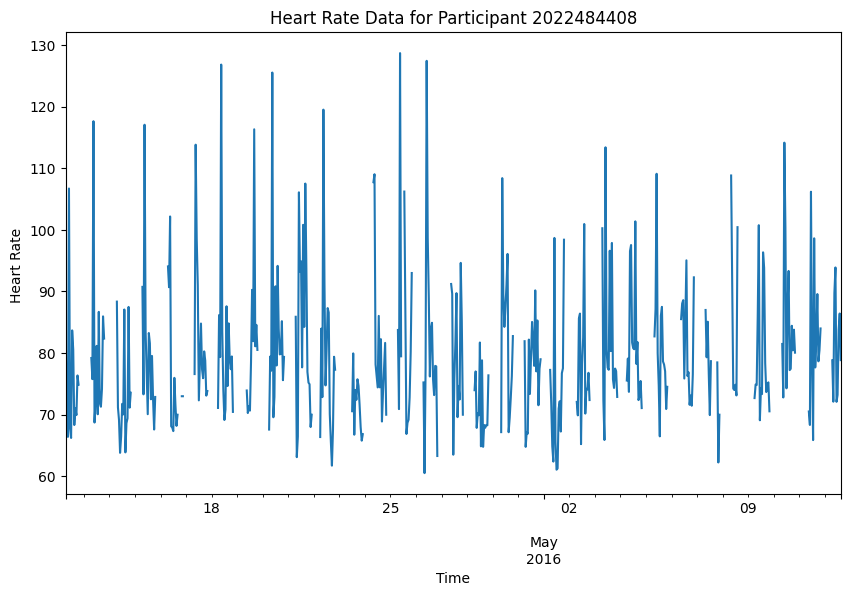

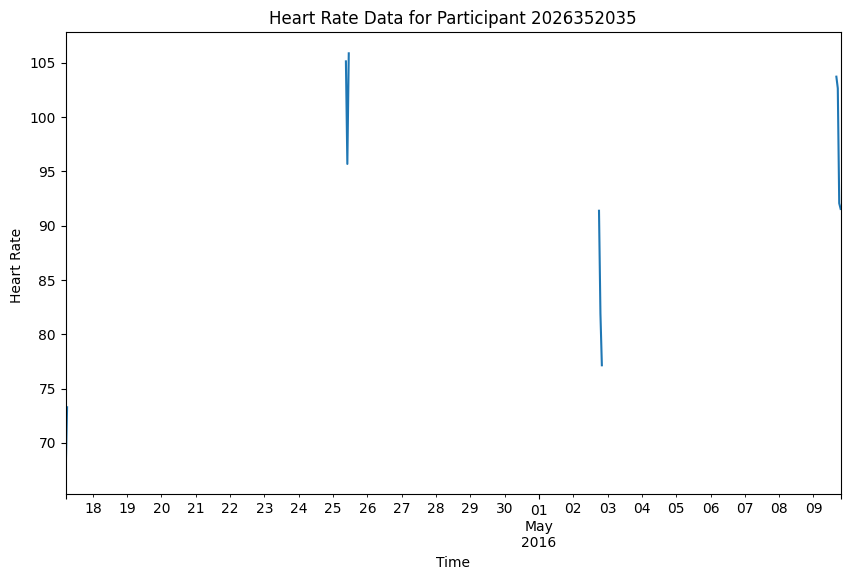

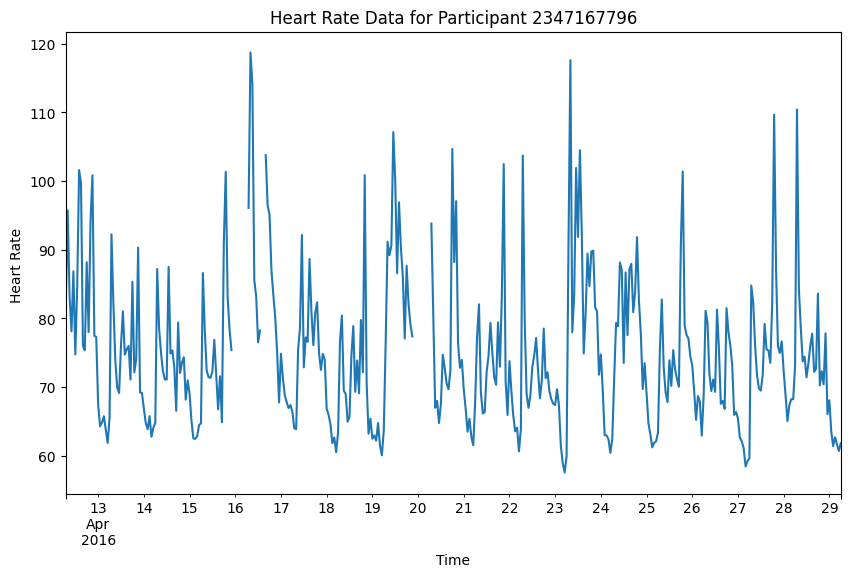

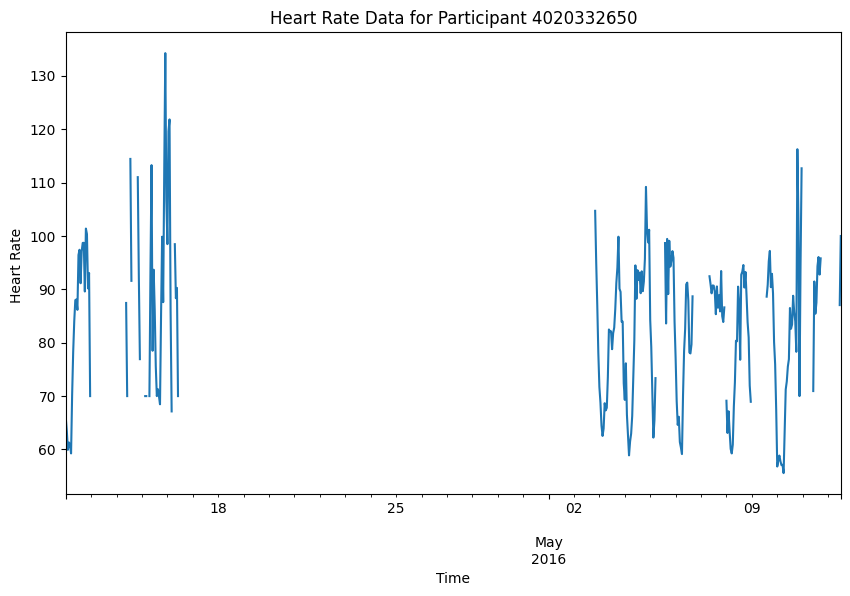

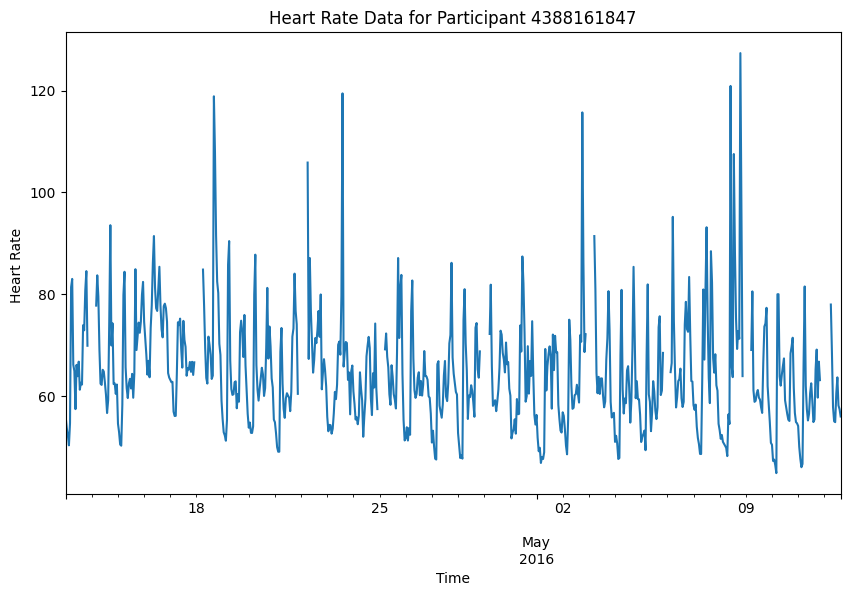

...

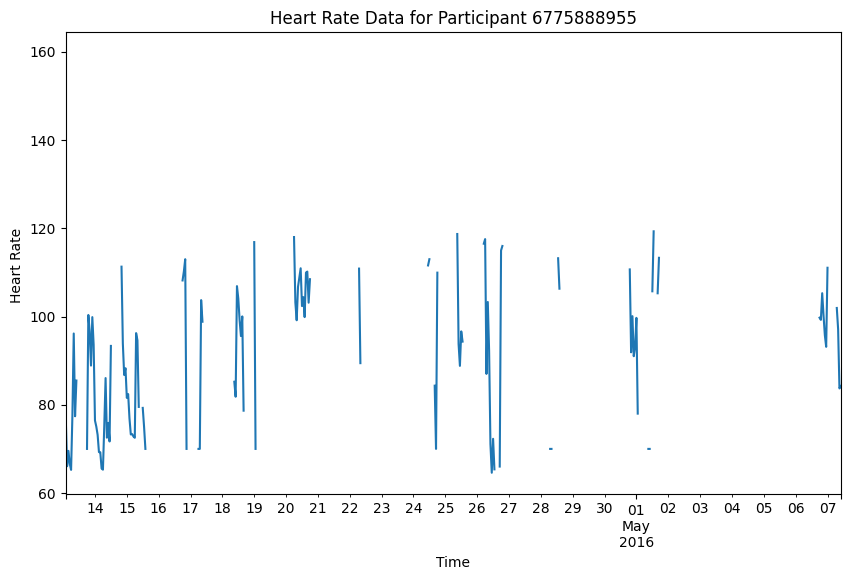

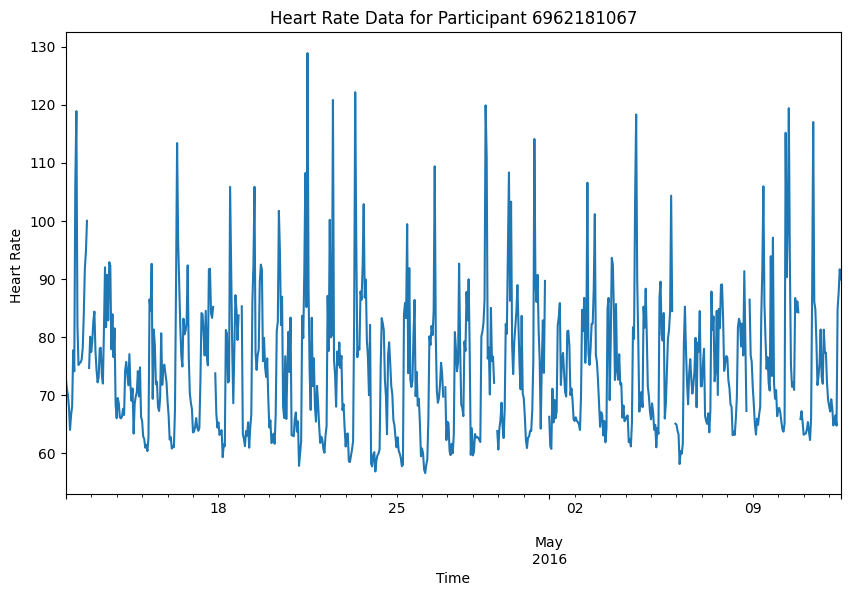

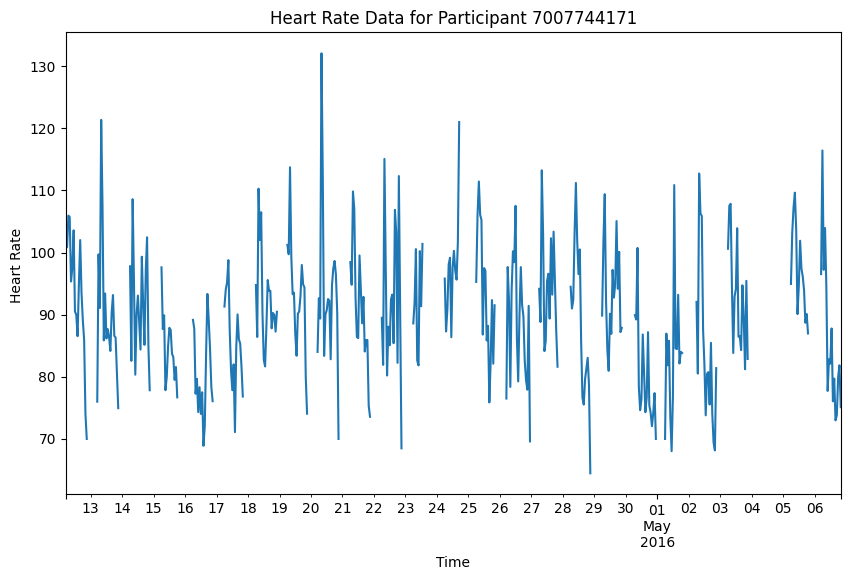

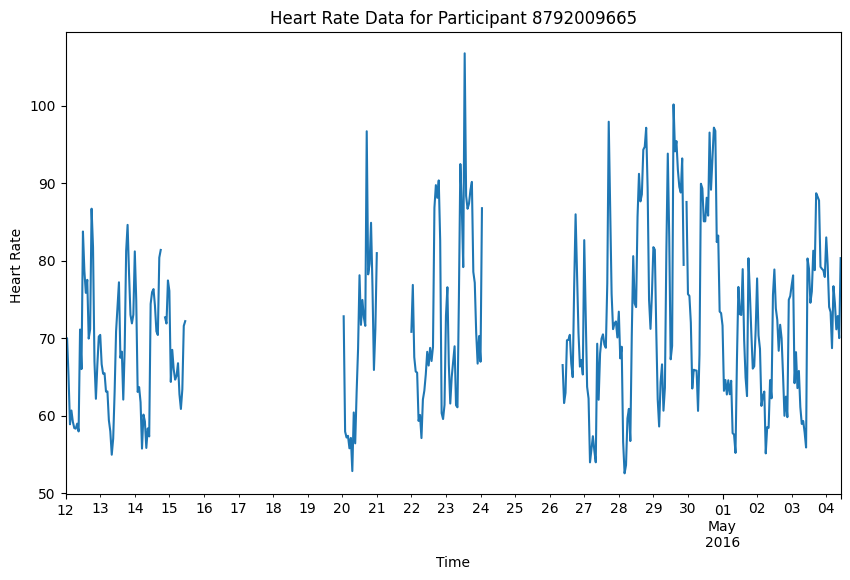

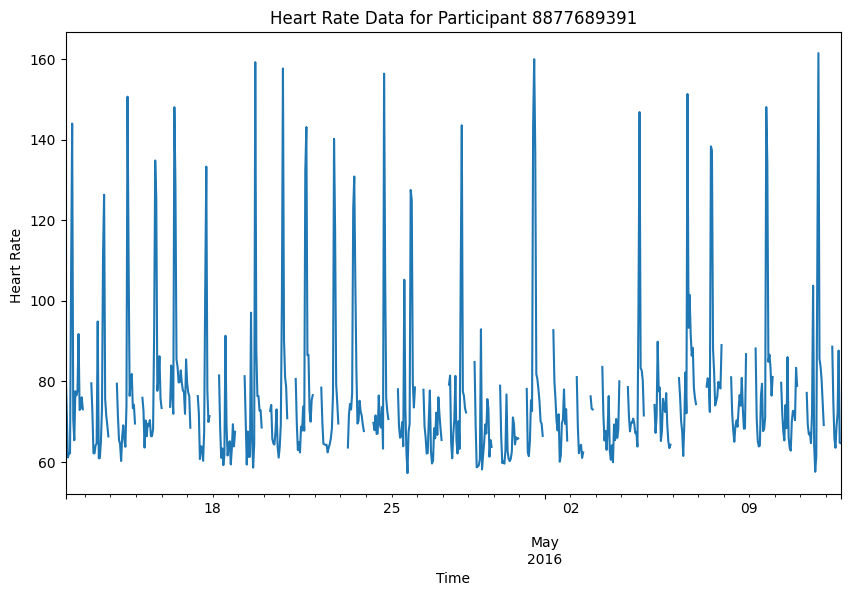

In [ ]:
participant_data = prepare_data(file_path)

# Aggregate data by minute
aggregated_data_minute = aggregate_data(participant_data, 'hourly')
plot_participant_data(aggregated_data_minute)

In [ ]:
import matplotlib.pyplot as plt

def plot_hourly_per_day(participant_data):
    # Plot hourly data for each day over each other for all participants
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))

        # Group data by date and plot each day's data
        for date, day_data in data.groupby(data.index.date):
            # Convert time to numerical values (seconds since midnight)
            time_values = [(t.hour * 3600 + t.minute * 60 + t.second) for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=str(date))

        plt.xlabel('Time of Day (Seconds since Midnight)')
        plt.ylabel('Heart Rate')
        plt.title(f'Heart Rate Data for Each Day for Participant {pid}')
        plt.legend(title='Date')
        plt.grid(True)
        plt.show()

 plot the daily data over each other which has been aggregated minutely

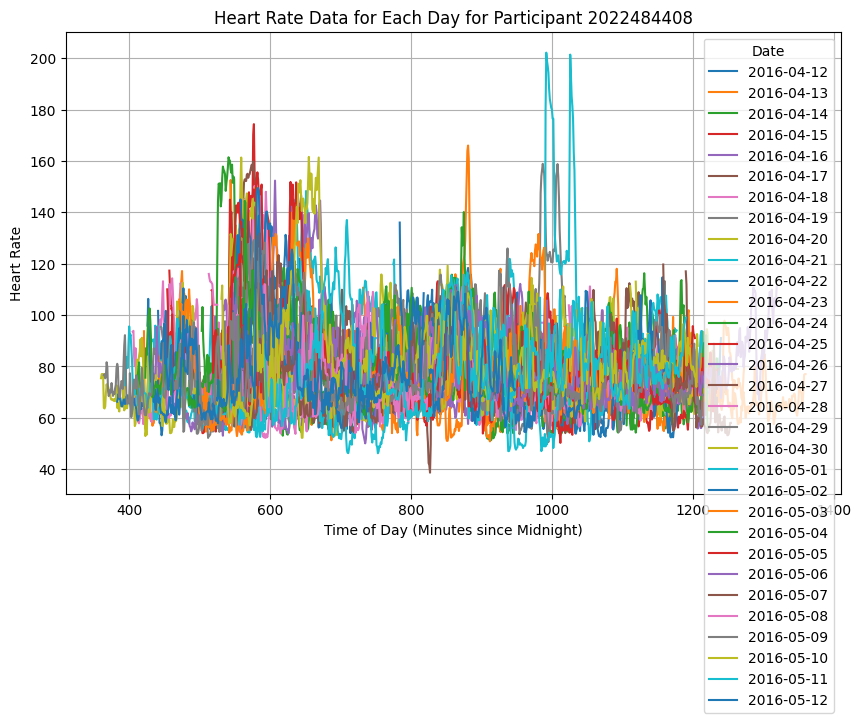

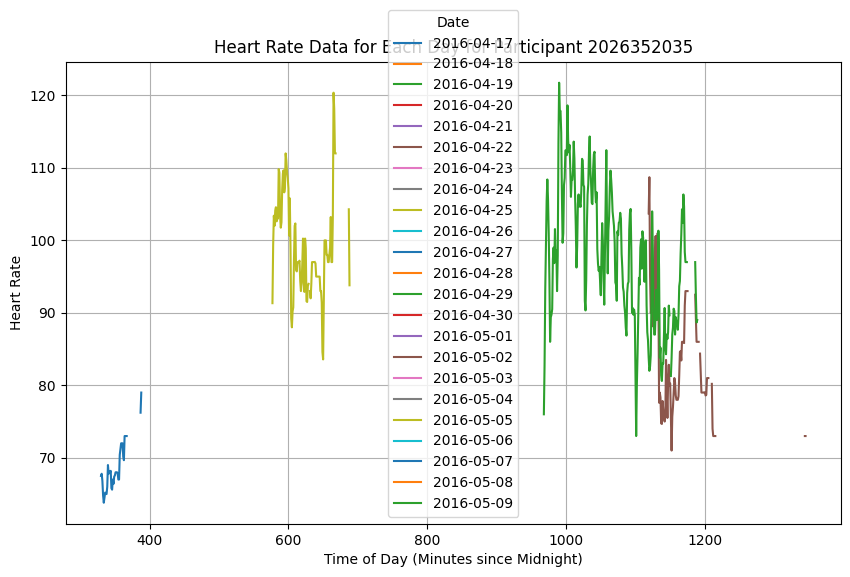

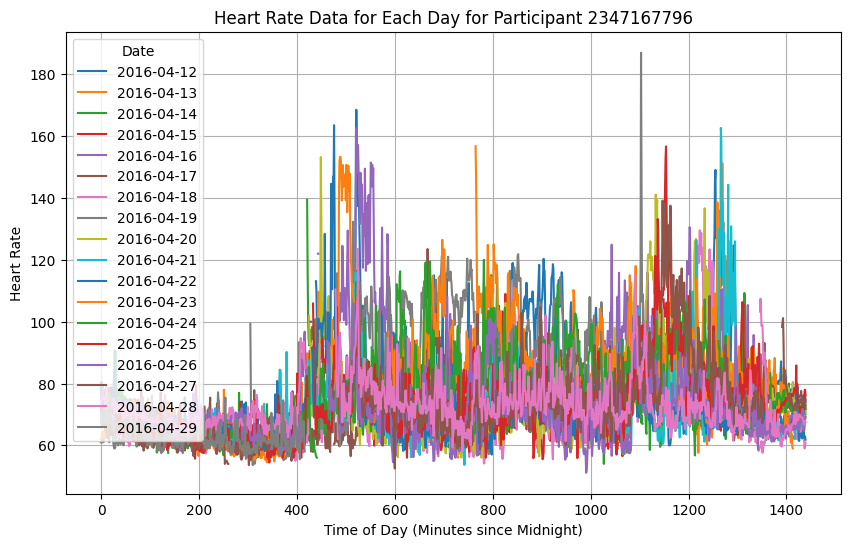

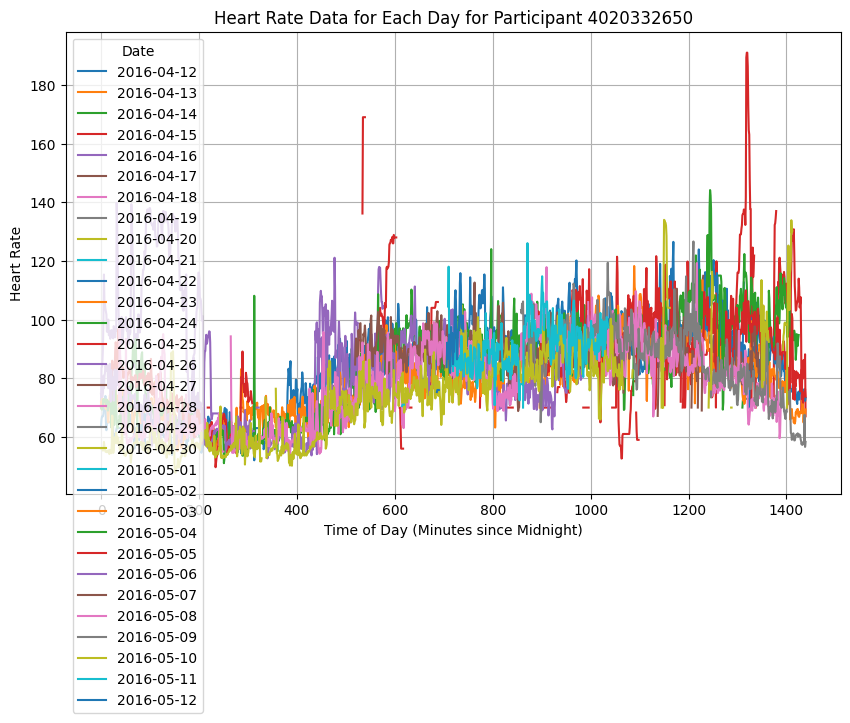

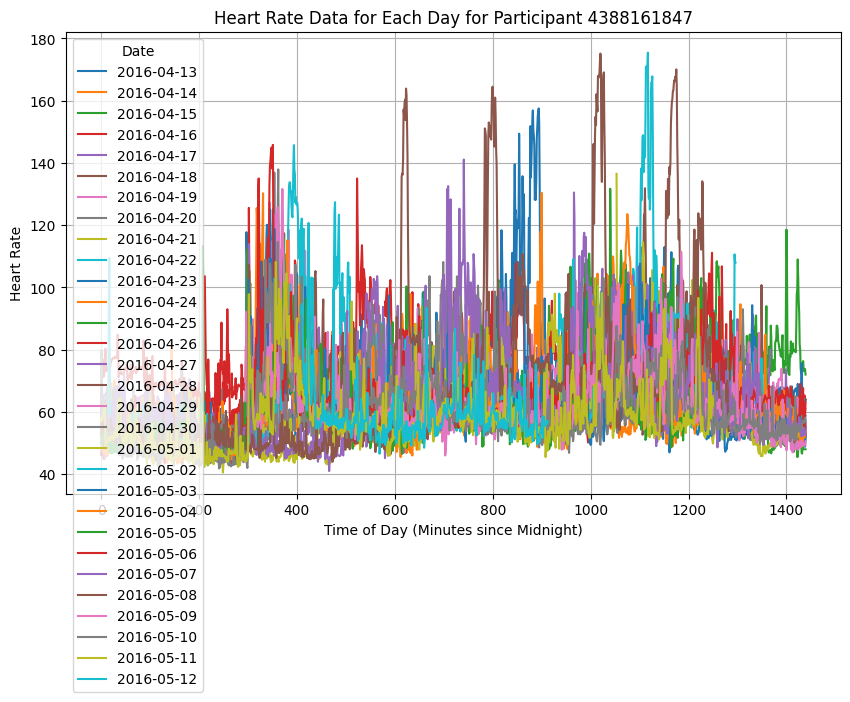

...

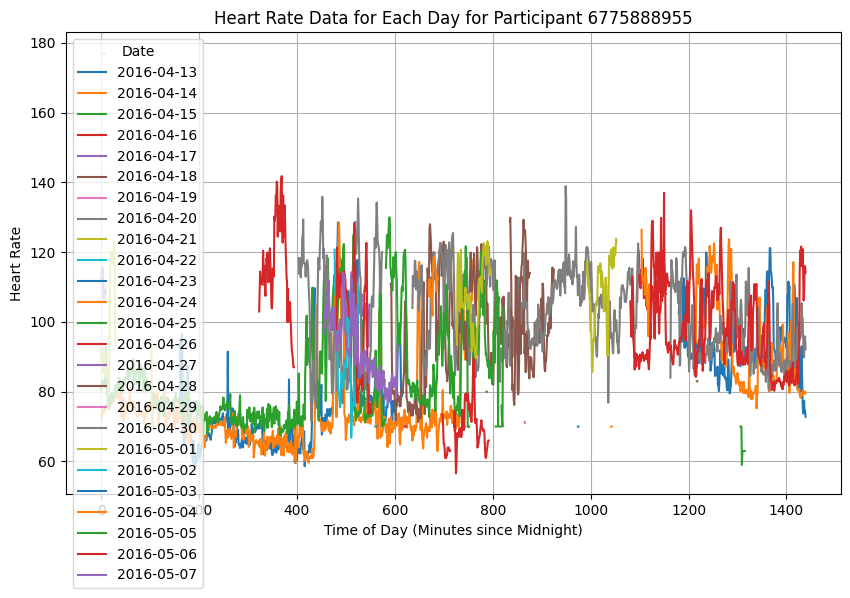

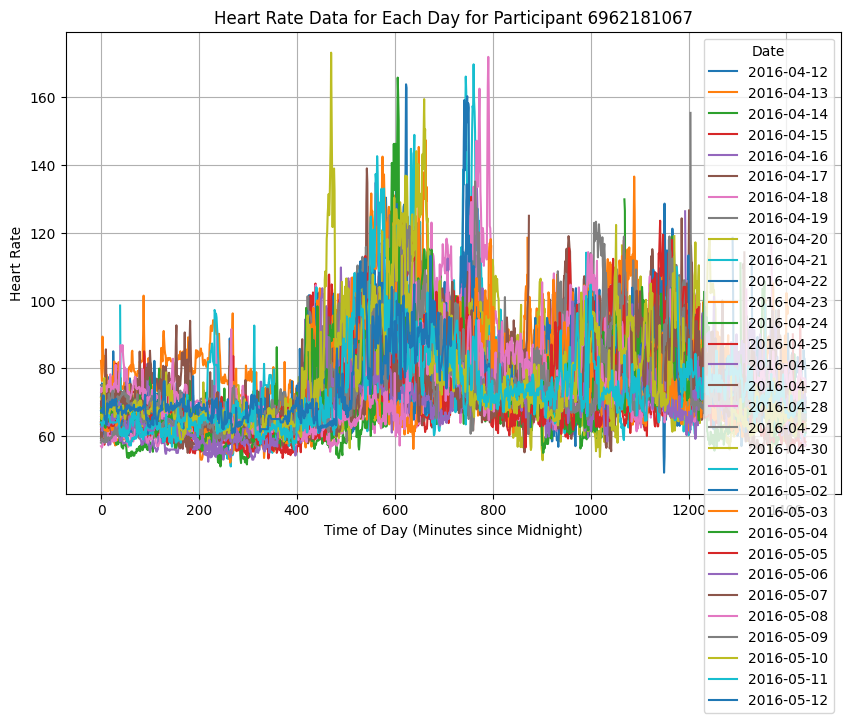

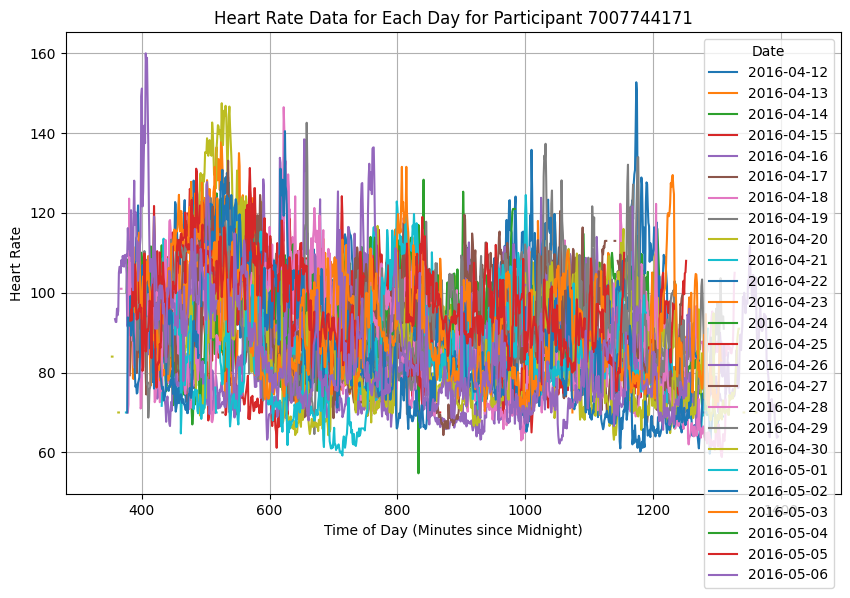

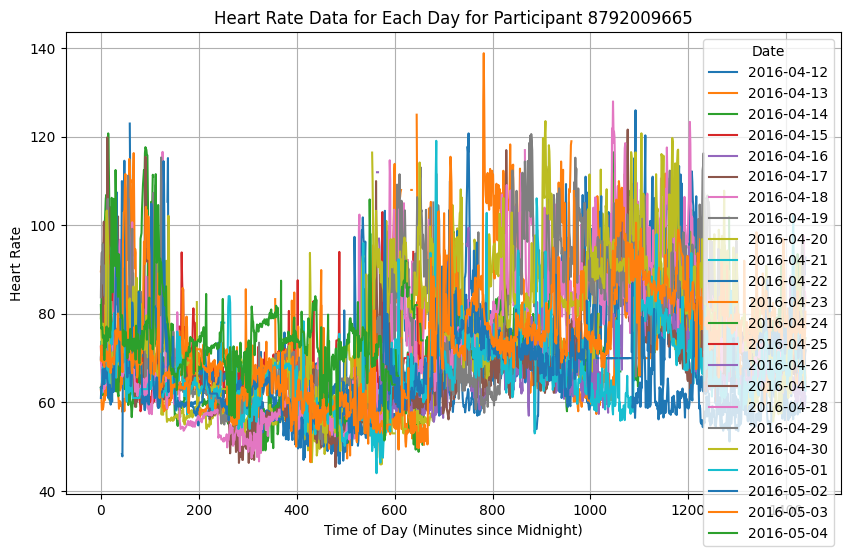

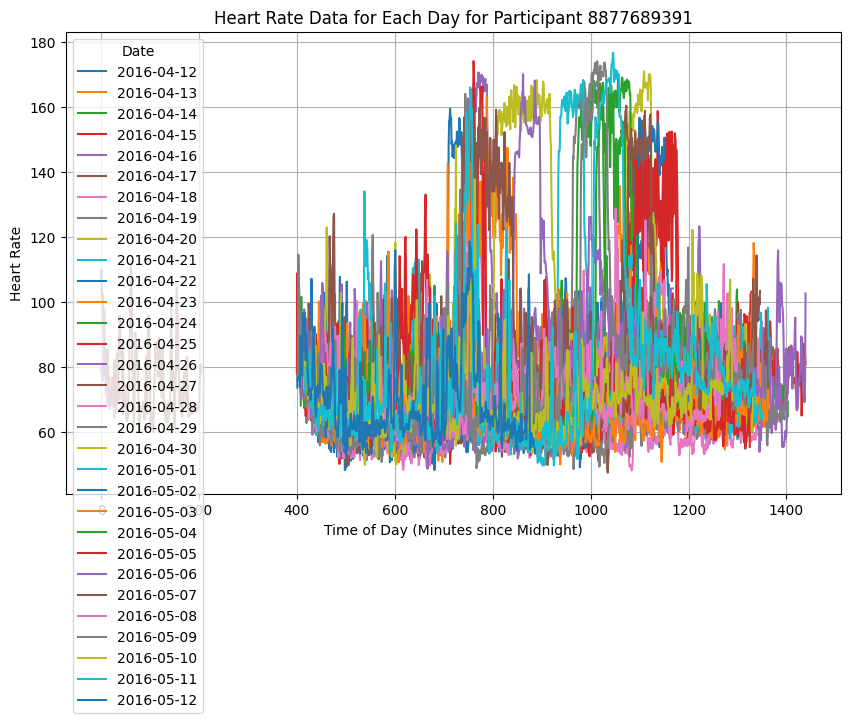

In [ ]:
import matplotlib.pyplot as plt

def plot_minute_per_day(participant_data):
    # Plot minute-level data for each day over each other for all participants
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))

        # Group data by date and plot each day's data
        for date, day_data in data.groupby(data.index.date):
            # Convert time to numerical values (minutes since midnight)
            time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=str(date))

        plt.xlabel('Time of Day (Minutes since Midnight)')
        plt.ylabel('Heart Rate')
        plt.title(f'Heart Rate Data for Each Day for Participant {pid}')
        plt.legend(title='Date')
        plt.grid(True)
        plt.show()

# Example usage
# Assuming you have already loaded and prepared your participant data
# participant_data = ... (your existing participant data)

plot_minute_per_day(participant_data=agg_minute)

daily plot of aggreagte every 15 minutes

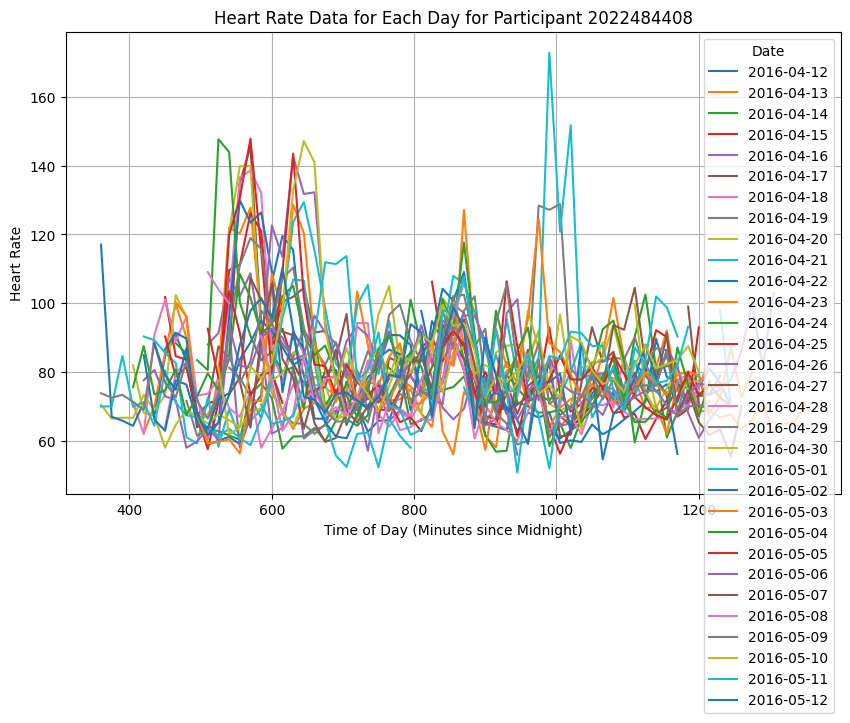

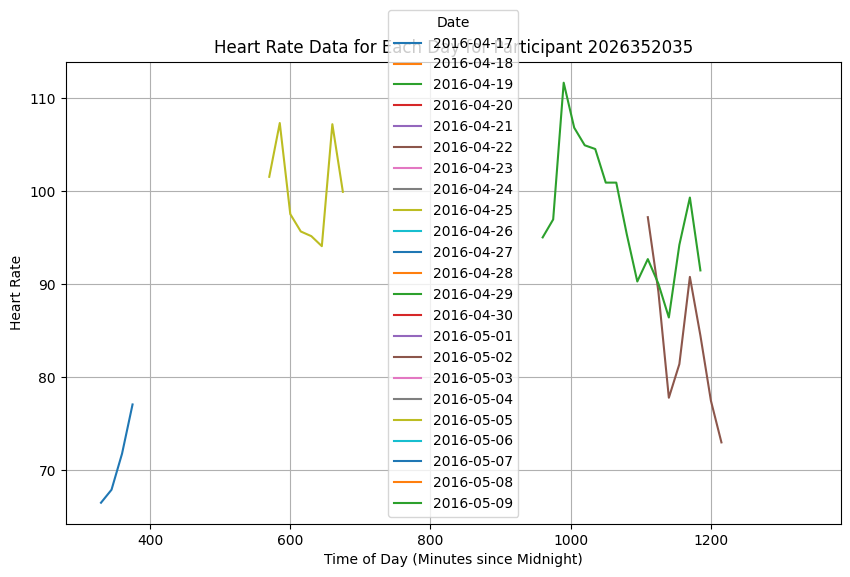

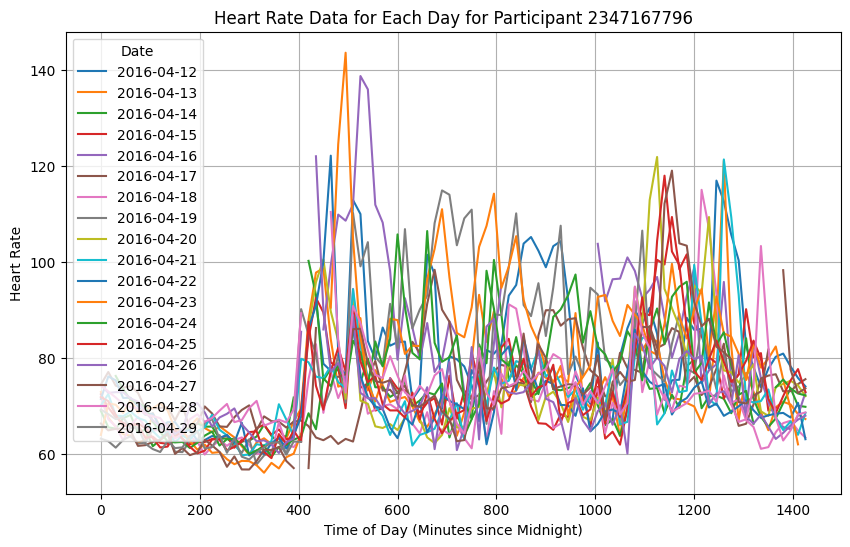

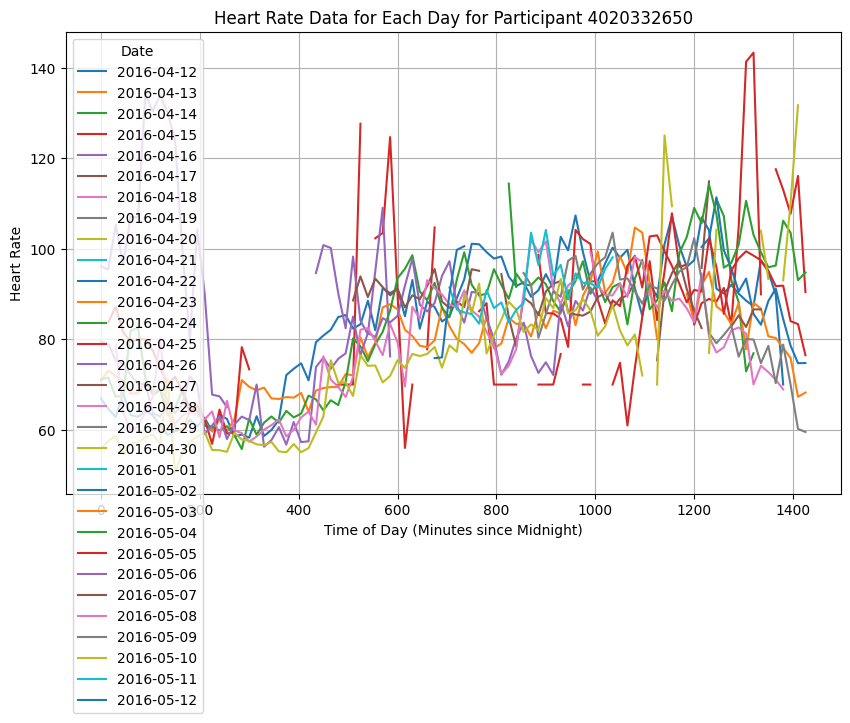

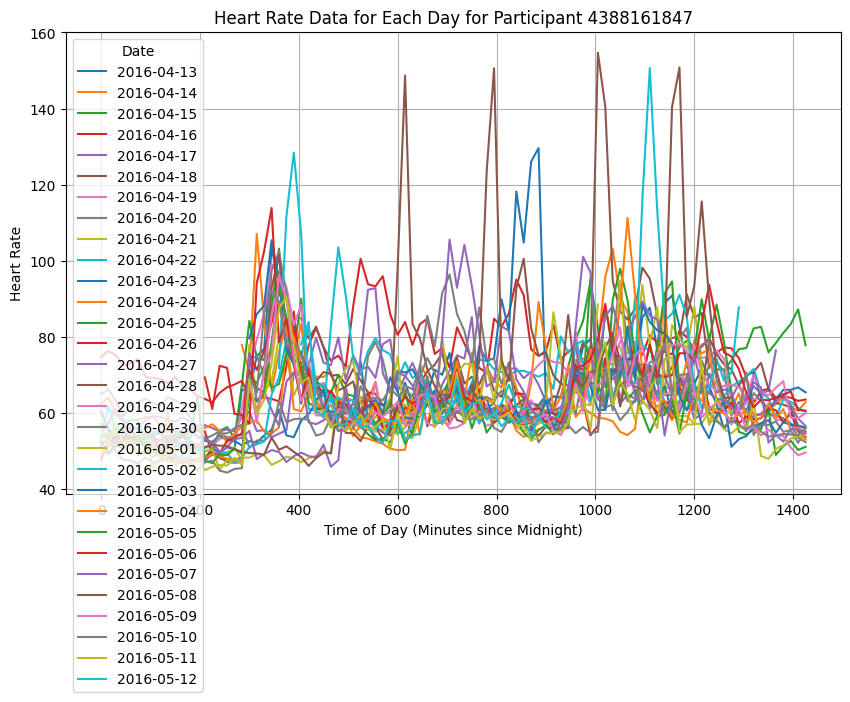

...

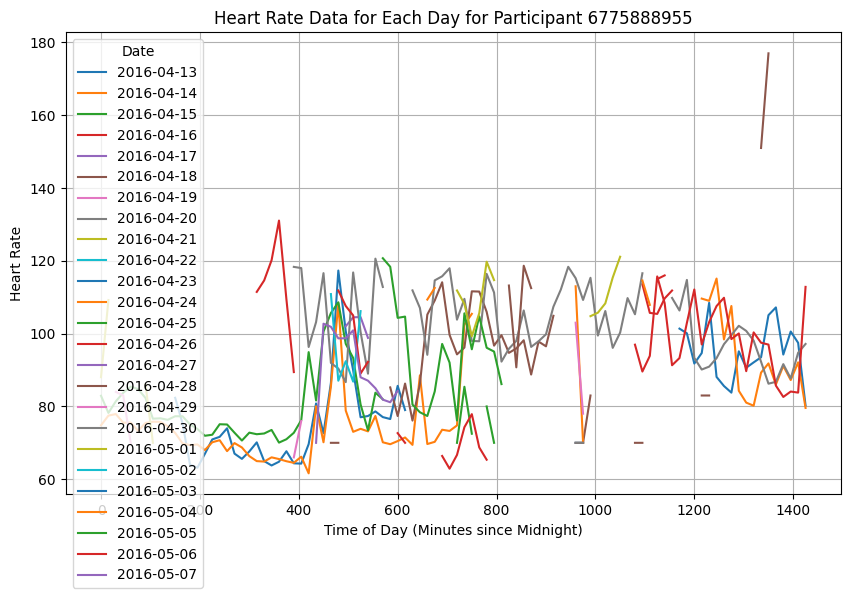

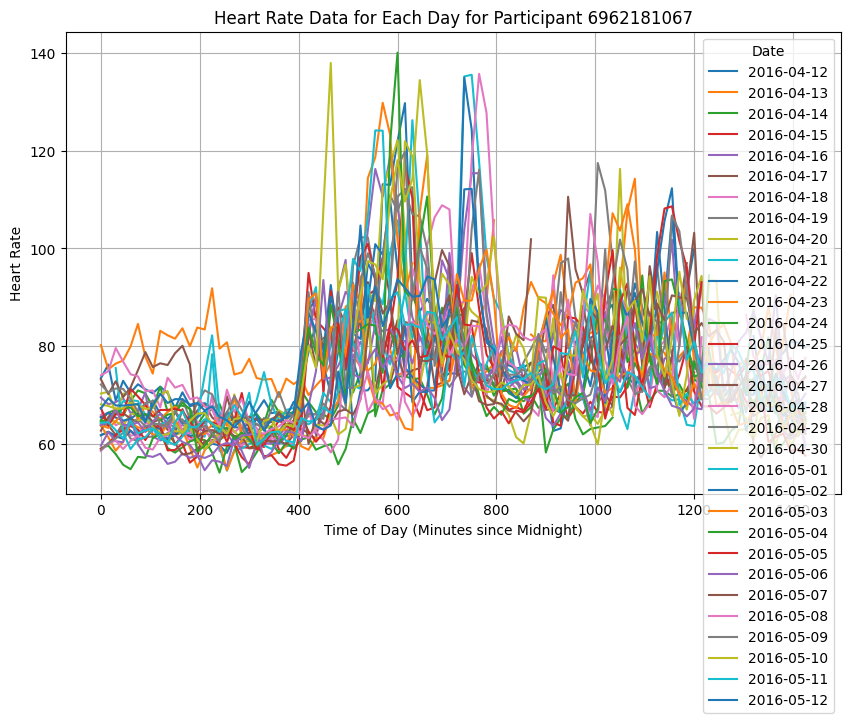

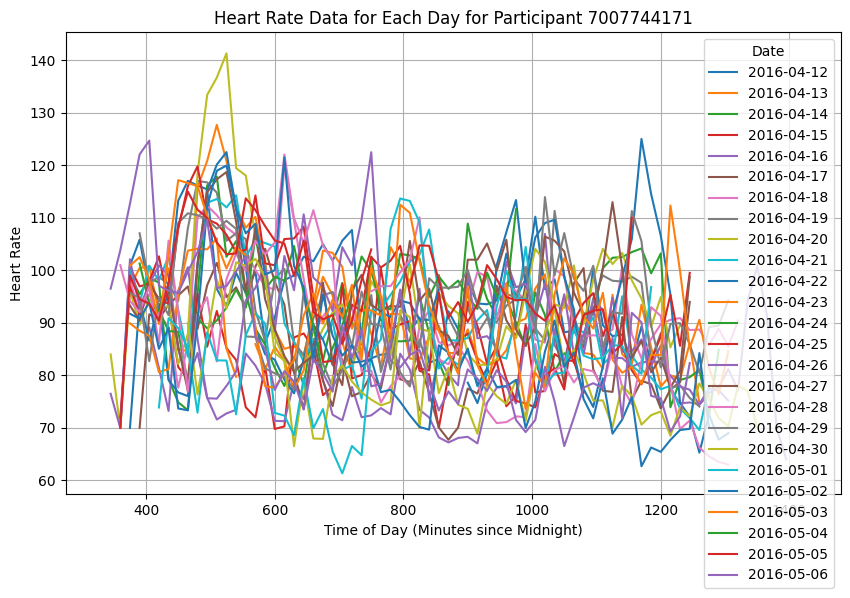

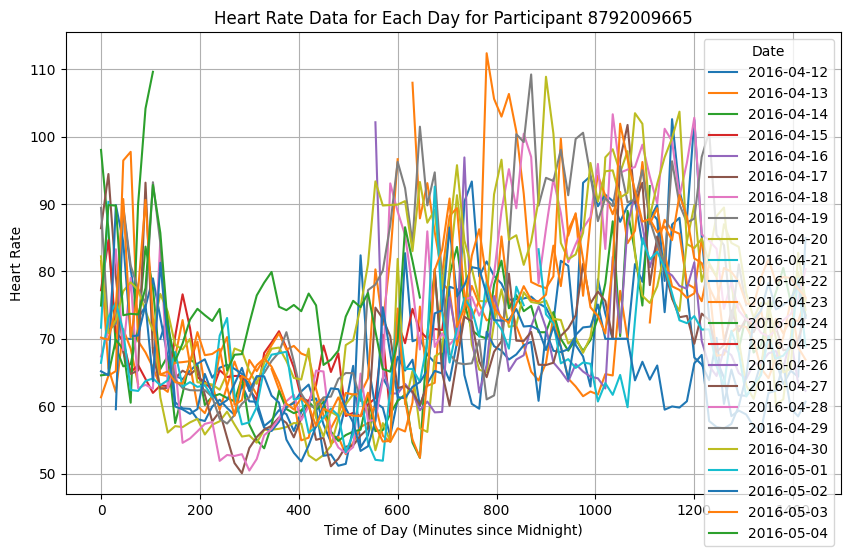

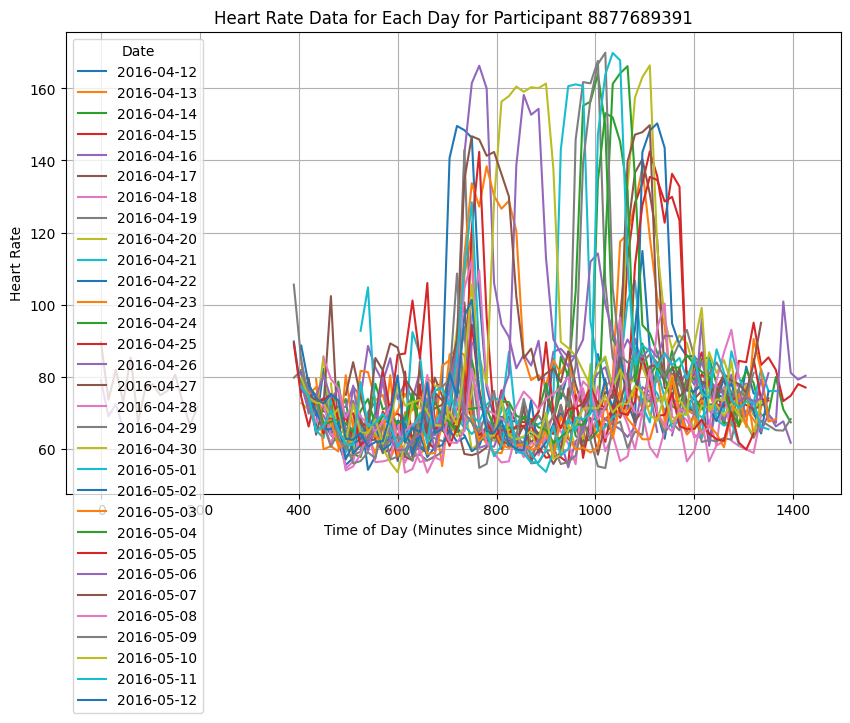

In [ ]:
import matplotlib.pyplot as plt

def plot_15_minute_per_day(participant_data):
    # Plot data aggregated every 15 minutes for each day over each other for all participants
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))

        # Group data by date and plot each day's data aggregated every 15 minutes
        for date, day_data in data.groupby(data.index.date):
            # Convert time to numerical values (minutes since midnight)
            time_values = [(t.hour * 60 + t.minute) for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=str(date))

        plt.xlabel('Time of Day (Minutes since Midnight)')
        plt.ylabel('Heart Rate')
        plt.title(f'Heart Rate Data for Each Day for Participant {pid}')
        plt.legend(title='Date')
        plt.grid(True)
        plt.show()

# Example usage
# Assuming you have already loaded and prepared your participant data
# participant_data = ... (your existing participant data)

plot_15_minute_per_day(participant_data=agg_15minute)

In [ ]:
import matplotlib.pyplot as plt

def plot_hourly_per_day(participant_data):
    # Plot hourly data for each day over each other for all participants
    for pid, data in participant_data.items():
        plt.figure(figsize=(10, 6))

        # Group data by date and plot each day's data
        for date, day_data in data.groupby(data.index.date):
            # Convert time to human-readable format
            time_values = [t.strftime('%H:%M') for t in day_data.index.time]
            plt.plot(time_values, day_data['Value'], label=str(date))

        plt.xlabel('Time of Day')
        plt.ylabel('Heart Rate')
        plt.title(f'Heart Rate Data for Each Day for Participant {pid}')
        plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
        plt.legend(title='Date')
        plt.grid(True)
        plt.show()

Function for filling the missing values with mean(interpolation)

In [ ]:
def fill_missing_values(participant_data):
    for pid, data in participant_data.items():
        # Group by time of day and fill missing values with the mean value for each time of day
        data['TimeOfDay'] = data.index.time
        data['Value'] = data.groupby('TimeOfDay')['Value'].transform(lambda x: x.fillna(x.mean()))
        participant_data[pid] = data.drop(columns='TimeOfDay')
    return participant_data

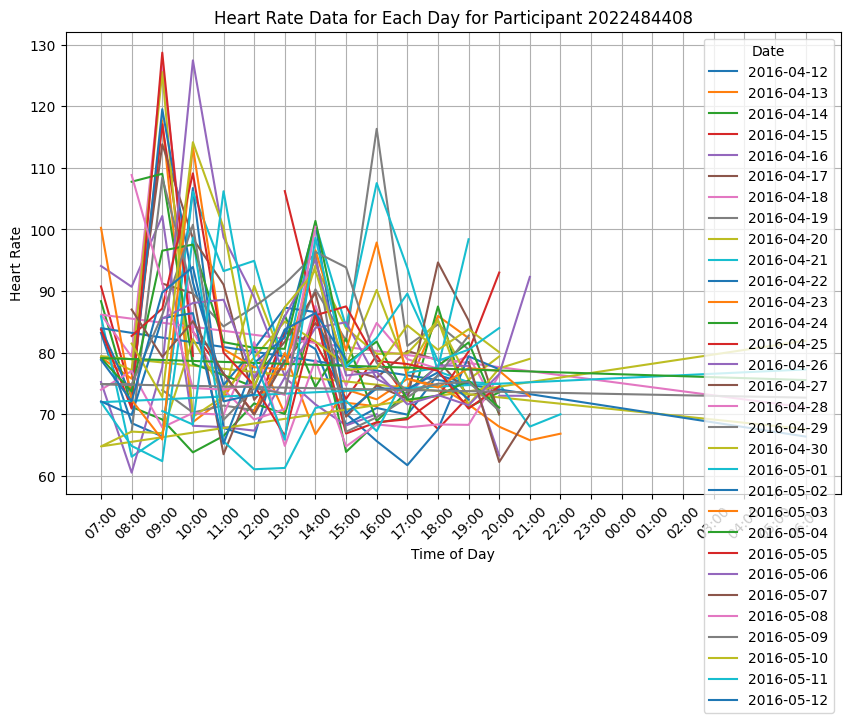

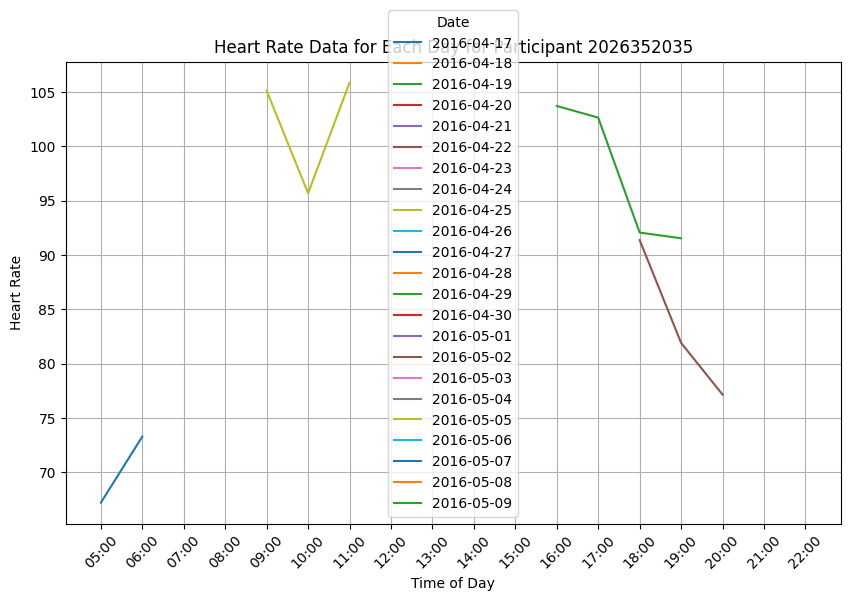

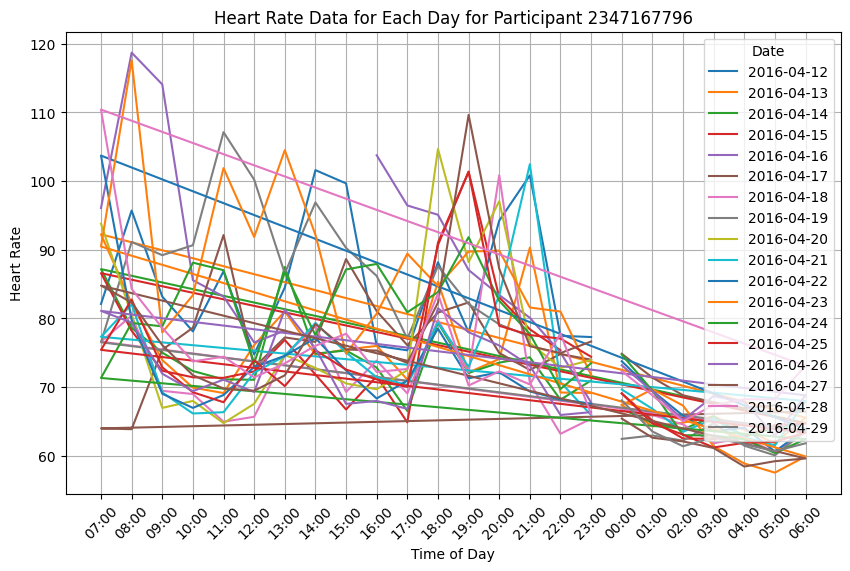

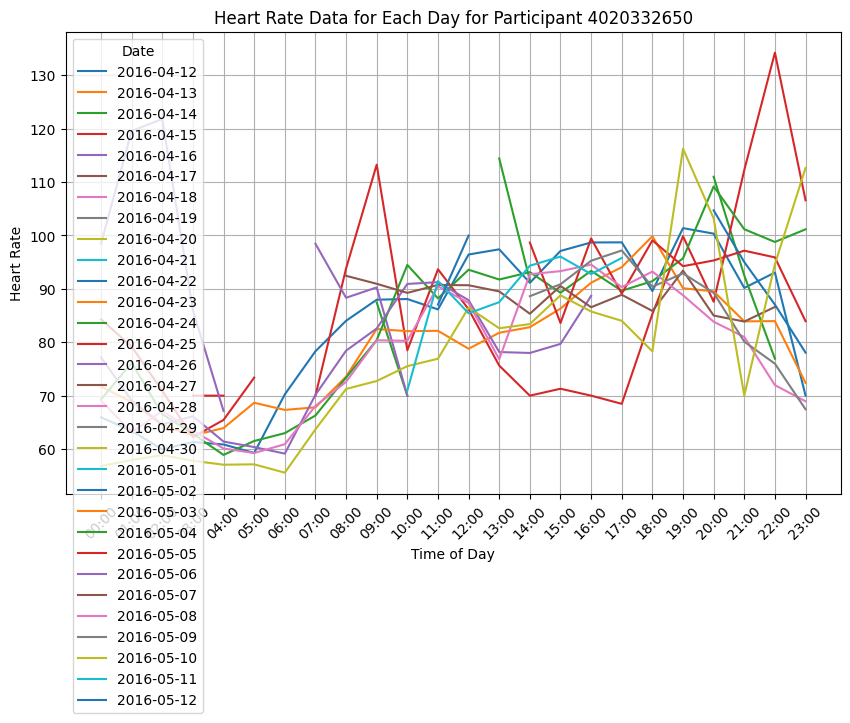

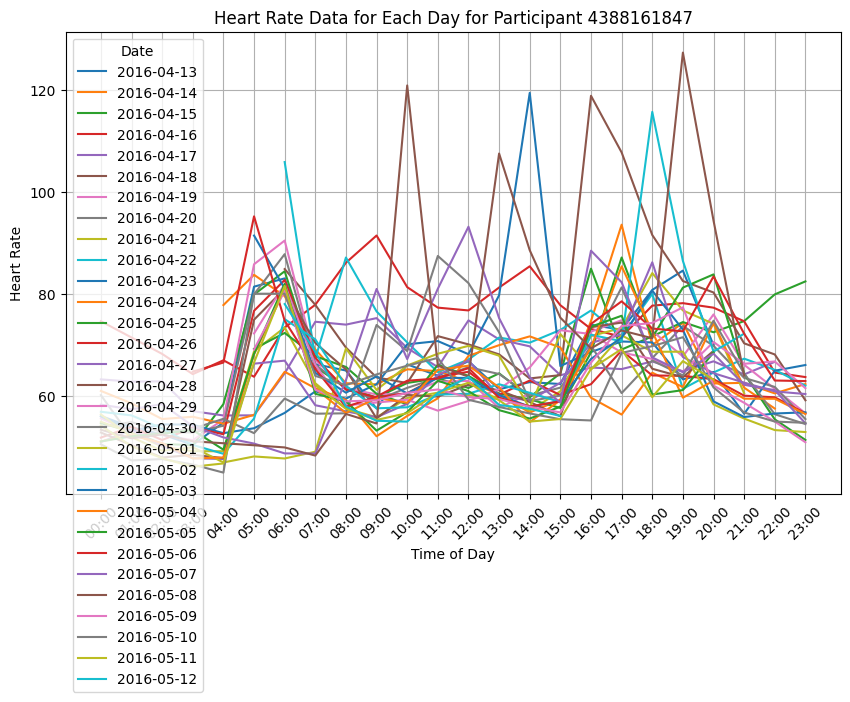

...

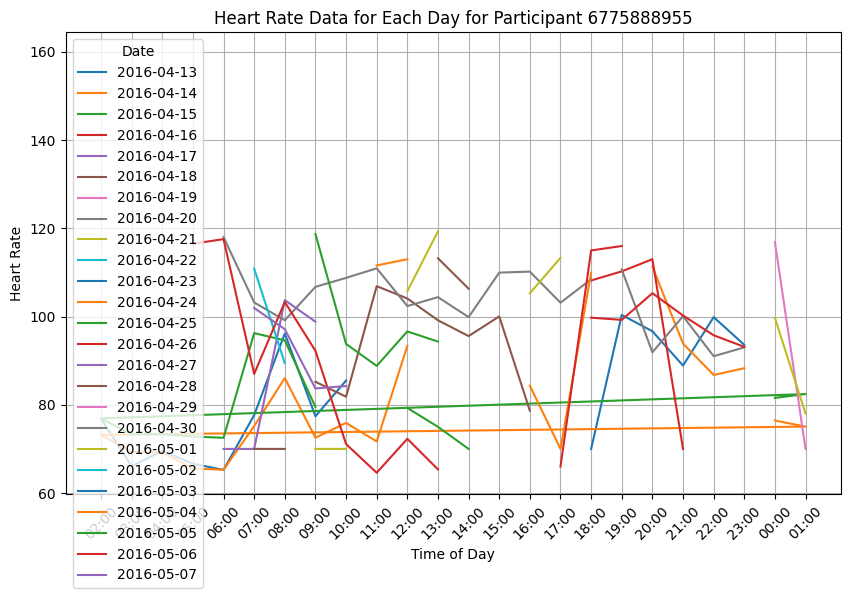

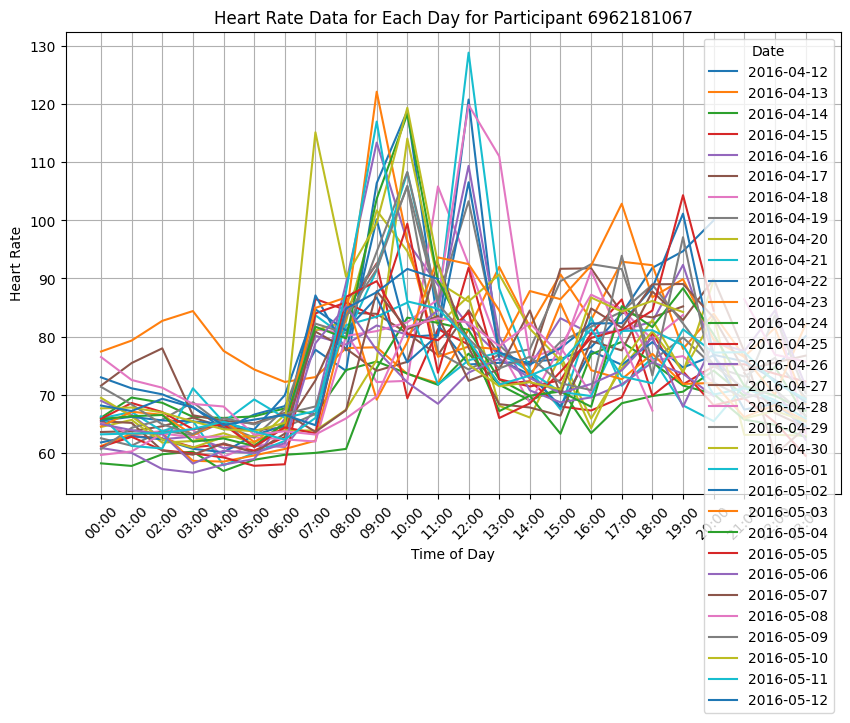

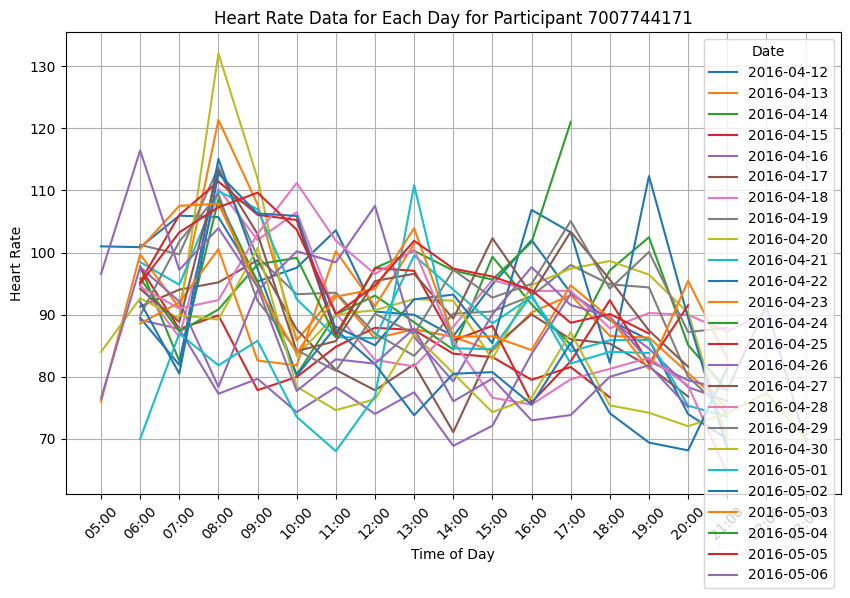

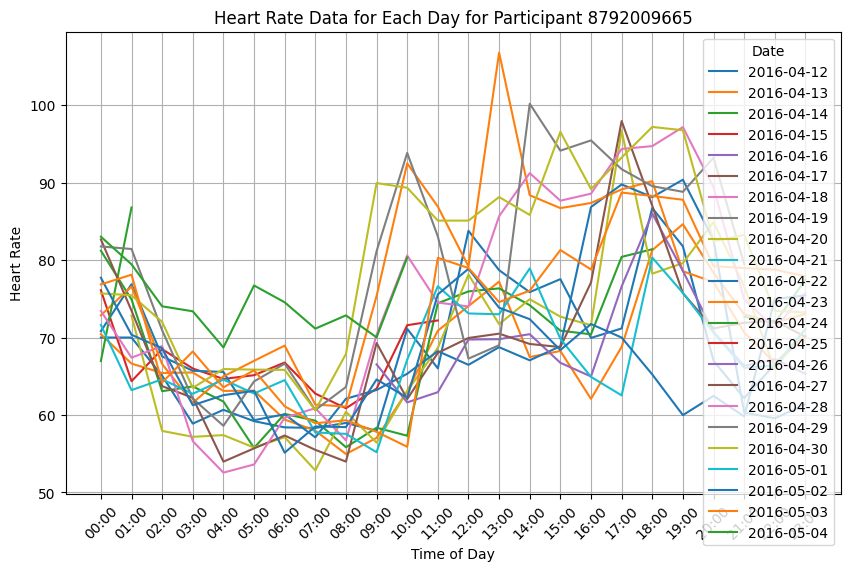

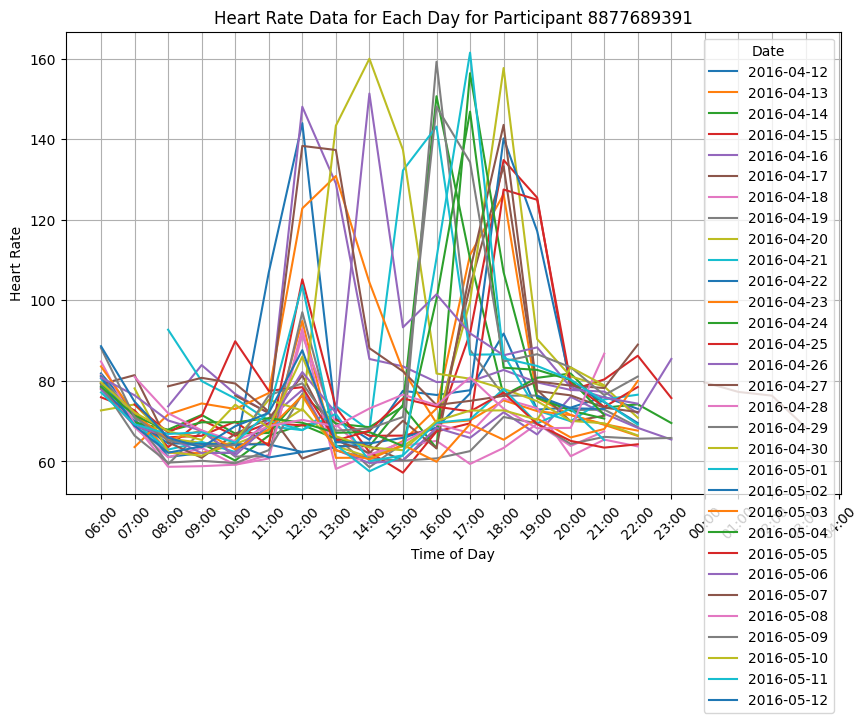

In [ ]:
# Aggregate data hourly
aggregated_data_hourly = aggregate_data(participant_data, 'hourly')

# Plot hourly data per day for each participant
plot_hourly_per_day(aggregated_data_hourly)

Plot the data for a participant during an specific period(2 days for example)

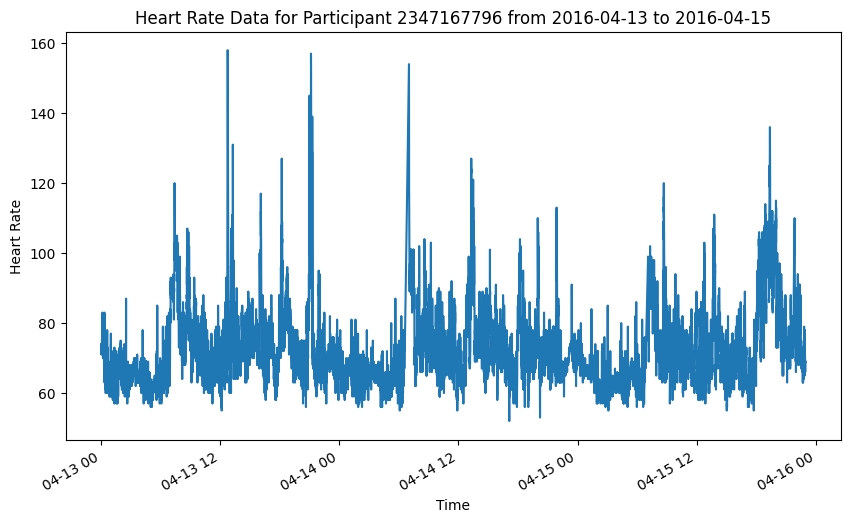

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def prepare_data(file_path):
    # Read the data from file
    df = pd.read_csv(file_path)

    # Convert 'Time' column to datetime
    df['Time'] = pd.to_datetime(df['Time'])

    # Initialize a dictionary to store DataFrames for each participant
    participant_data = {}

    # Loop through each unique participant ID
    for participant_id in df['Id'].unique():
        # Filter data for the current participant
        participant_df = df[df['Id'] == participant_id].copy()

        # Set 'Time' as the index
        participant_df.set_index('Time', inplace=True)

        # Store the DataFrame in the dictionary
        participant_data[participant_id] = participant_df

    return participant_data

def plot_participant_data(participant_data, participant_id, start_date, end_date):
    if participant_id not in participant_data:
        print(f"No data found for participant ID: {participant_id}")
        return

    data = participant_data[participant_id]

    # Filter data for the given date range
    filtered_data = data[start_date:end_date]

    # Plot the filtered data
    filtered_data['Value'].plot(figsize=(10, 6))
    plt.title(f'Heart Rate Data for Participant {participant_id} from {start_date} to {end_date}')
    plt.xlabel('Time')
    plt.ylabel('Heart Rate')
    plt.show()

# Example usage
file_path = "/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Plot data for a specific participant within a date range
participant_id = 2347167796  # Replace with your participant ID
start_date = '2016-04-13'
end_date = '2016-04-15'
plot_participant_data(participant_data, participant_id, start_date, end_date)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

def prepare_data(file_path):
    # Read the data from file
    df = pd.read_csv(file_path)

    # Convert 'Time' column to datetime
    df['Time'] = pd.to_datetime(df['Time'])

    # Initialize a dictionary to store DataFrames for each participant
    participant_data = {}

    # Loop through each unique participant ID
    for participant_id in df['Id'].unique():
        # Filter data for the current participant
        participant_df = df[df['Id'] == participant_id].copy()

        # Set 'Time' as the index
        participant_df.set_index('Time', inplace=True)

        # Store the DataFrame in the dictionary
        participant_data[participant_id] = participant_df

    return participant_data

def check_data_start(df):
    # Check the first entry's day of the week
    start_day = df.index[0].weekday()
    print(f"Data starts on day: {start_day} (0=Monday, 6=Sunday)")

def plot_data_for_specific_date(df, specific_date, start_time='00:00', end_time='08:00'):
    # Filter data for the specific date
    specific_date_data = df[specific_date]

    # Further filter the data to include only the desired time range
    time_filtered_data = specific_date_data.between_time(start_time, end_time)

    # Plot the filtered data
    plt.figure(figsize=(10, 6))
    plt.plot(time_filtered_data.index.time, time_filtered_data['Value'], label=f'{specific_date} {start_time}-{end_time}', color='blue', linewidth=2)
    plt.xlabel('Time of Day')
    plt.ylabel('Value')
    plt.title(f'Data for {specific_date} from {start_time} to {end_time}')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.show()

def plot_average_patterns(df):
    # Filter data to include only the time range from '00:00' to '08:00'
    df = df.between_time('00:00', '08:00')

    # Separate the data into weekdays and weekends
    weekdays_df = df[df.index.weekday.isin(range(0, 5))]  # Weekdays (Monday to Friday)
    weekends_df = df[df.index.weekday.isin([5, 6])]       # Weekends (Saturday, Sunday)

    # Calculate the average pattern for weekdays
    weekdays_mean_pattern = weekdays_df.groupby(weekdays_df.index.time).mean()

    # Calculate the average pattern for weekends
    weekends_mean_pattern = weekends_df.groupby(weekends_df.index.time).mean()

    # Plot the average pattern for weekdays
    plt.figure(figsize=(10, 6))
    x_values_weekdays = [(t.hour * 60 + t.minute) for t in weekdays_mean_pattern.index]
    plt.plot(x_values_weekdays, weekdays_mean_pattern['Value'], label='Weekdays Average Pattern', color='blue', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekdays (00:00 to 08:00)')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot the average pattern for weekends
    plt.figure(figsize=(10, 6))
    x_values_weekends = [(t.hour * 60 + t.minute) for t in weekends_mean_pattern.index]
    plt.plot(x_values_weekends, weekends_mean_pattern['Value'], label='Weekends Average Pattern', color='green', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekends (00:00 to 08:00)')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
file_path = "/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Analyze data for a specific participant
id = 2347167796
df = participant_data[id]

# Check if the data starts from the first day of the week
check_data_start(df)

# Plot average patterns for the specific participant
plot_average_patterns(df)


In [ ]:
pip install minisom

  Preparing metadata (setup.py) ... done
  Created wheel for minisom: filename=MiniSom-2.3.2-py3-none-any.whl size=10650 sha256=47e07b527336d53d06a70370b4ae3038ba83e33960ce54d4fbfcbf208b032549
  Stored in directory: /root/.cache/pip/wheels/b4/f6/8a/9daf8831901c3e3805775633404248f10663d1c80b7e5a1314
Successfully built minisom


Find the optimal number of clusters based on silhoute and elbow methods

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def find_optimal_clusters(data, max_k):
    iters = range(2, max_k+1)

    sse = []
    silhouette_scores = []

    for k in iters:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data)
        sse.append(kmeans.inertia_)
        silhouette_scores.append(silhouette_score(data, kmeans.labels_))

    return iters, sse, silhouette_scores

def plot_elbow_silhouette(iters, sse, silhouette_scores):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

    ax1.plot(iters, sse, '-o')
    ax1.set_xlabel('Number of clusters')
    ax1.set_ylabel('SSE')
    ax1.set_title('Elbow Method')

    ax2.plot(iters, silhouette_scores, '-o')
    ax2.set_xlabel('Number of clusters')
    ax2.set_ylabel('Silhouette Score')
    ax2.set_title('Silhouette Scores')

    plt.show()

def analyze_participant_clusters(participant_data, participant_id, max_k=10):
    if participant_id not in participant_data:
        print(f"No data found for participant ID: {participant_id}")
        return

    data = participant_data[participant_id]

    # Resample to get daily data
    daily_data = data.resample('D').apply(lambda x: x.tolist())

    # Prepare the feature matrix
    feature_matrix = pd.DataFrame(daily_data['Value'].values.tolist(), index=daily_data.index)

    # Handle missing values by filling with the mean of each column (time of the day)
    feature_matrix.fillna(feature_matrix.mean(), inplace=True)

    # Finding the optimal number of clusters
    iters, sse, silhouette_scores = find_optimal_clusters(feature_matrix, max_k)

    # Plotting the elbow method and silhouette scores
    plot_elbow_silhouette(iters, sse, silhouette_scores)

# Example usage
# Assuming you have already loaded and prepared your participant data
file_path = "/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Analyze clusters for a specific participant
analyze_participant_clusters(participant_data, participant_id=2347167796, max_k=15)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: Average missing values percentage per day: 17.92%
Cluster 1: Average missing values percentage per day: 10.80%
Silhouette Score: 0.158
Calinski-Harabasz Index: 3.193
Davies-Bouldin Index: 2.167


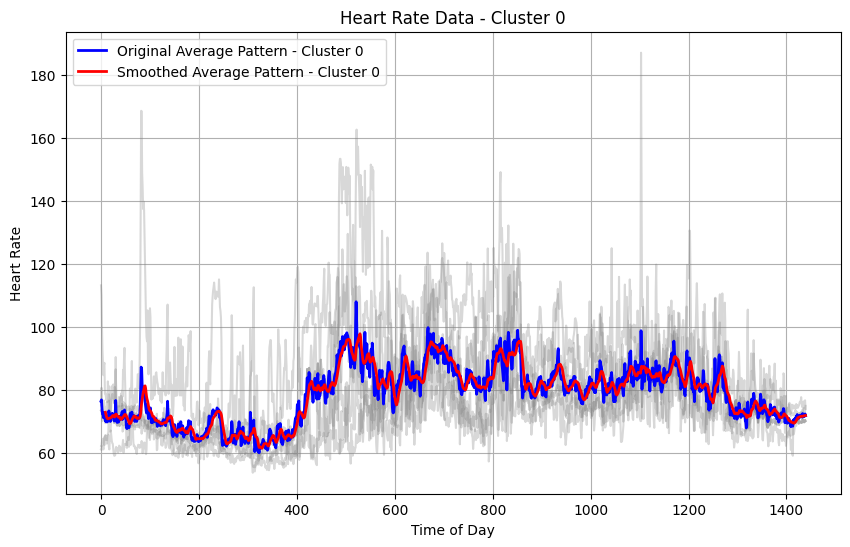

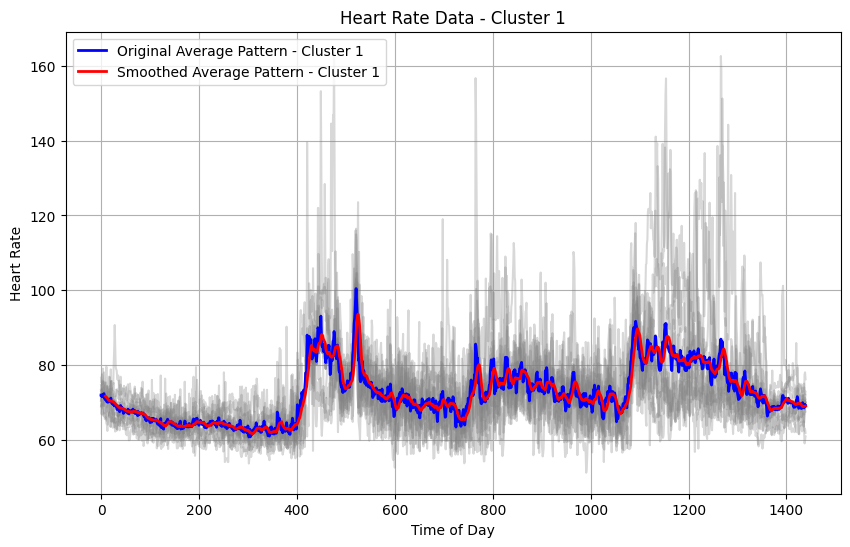

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def moving_average(data, window_size):
    return data.rolling(window=window_size).mean()

def cluster_participant_heart_rate(participant_data, participant_id, num_clusters, window_size):
    if participant_id not in participant_data:
        print(f"No data found for participant ID: {participant_id}")
        return

    data = participant_data[participant_id][['Value']]

    #Resample to get daily data
    daily_data = data.resample('D').apply(lambda x: x.tolist())

    #Prepare the feature matrix
    feature_matrix = pd.DataFrame(daily_data['Value'].values.tolist(), index=daily_data.index)

    # Handle missing values by filling with the mean of each column (time of the day)
    feature_matrix.fillna(feature_matrix.mean(), inplace=True)

    # Normalize the data
    scaler = StandardScaler()
    normalized_data = scaler.fit_transform(feature_matrix)

    # Apply k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    clusters = kmeans.fit_predict(normalized_data)

    # Add cluster labels to the feature matrix
    feature_matrix['Cluster'] = clusters

    # Calculate and print the missing percentage for each cluster
    feature_matrix_original = pd.DataFrame(daily_data['Value'].values.tolist(), index=daily_data.index)  # Original feature matrix without filling missing values
    missing_percentage_per_cluster = {}
    for cluster in range(num_clusters):
        cluster_indices = feature_matrix[feature_matrix['Cluster'] == cluster].index
        cluster_missing_percentage = feature_matrix_original.loc[cluster_indices].isna().mean().mean() * 100
        missing_percentage_per_cluster[cluster] = cluster_missing_percentage
        print(f"Cluster {cluster}: Average missing values percentage per day: {cluster_missing_percentage:.2f}%")

    # Calculate clustering evaluation scores
    silhouette_avg = silhouette_score(normalized_data, clusters)
    calinski_harabasz = calinski_harabasz_score(normalized_data, clusters)
    davies_bouldin = davies_bouldin_score(normalized_data, clusters)

    print(f"Silhouette Score: {silhouette_avg:.3f}")
    print(f"Calinski-Harabasz Index: {calinski_harabasz:.3f}")
    print(f"Davies-Bouldin Index: {davies_bouldin:.3f}")

    # Plot each cluster separately and show the average pattern
    unique_clusters = feature_matrix['Cluster'].unique()
    for cluster in unique_clusters:
        plt.figure(figsize=(10, 6))
        cluster_data = feature_matrix[feature_matrix['Cluster'] == cluster].drop('Cluster', axis=1)

        # Plot individual days
        for day in cluster_data.index:
            plt.plot(cluster_data.columns, cluster_data.loc[day], alpha=0.3, color='gray')

        # Plot original average pattern
        mean_pattern = cluster_data.mean()
        plt.plot(mean_pattern.index, mean_pattern.values, label=f'Original Average Pattern - Cluster {cluster}', color='blue', linewidth=2)

        # Smooth the average pattern
        smoothed_pattern = moving_average(mean_pattern, window_size)
        plt.plot(smoothed_pattern.index, smoothed_pattern.values, label=f'Smoothed Average Pattern - Cluster {cluster}', color='red', linewidth=2)

        plt.xlabel('Time of Day')
        plt.ylabel('Heart Rate')
        plt.title(f'Heart Rate Data - Cluster {cluster}')
        plt.legend()
        plt.grid(True)
        plt.show()

# Example usage
# Assuming you have already loaded and prepared your participant data
# participant_data = ... (your existing participant data)
# optimal_num_clusters = ... (the optimal number of clusters you found)
participant_id = 2347167796  # Replace with your participant ID
optimal_num_clusters = 2 # Replace with the optimal number of clusters you found
window_size = 10  # Choose the window size for moving average smoothing

# Cluster data for a specific participant
cluster_participant_heart_rate(agg_minute, participant_id, optimal_num_clusters, window_size)

clustering the minute-by-minute data with moving avergae and SG smoothing

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score: 0.336
Calinski-Harabasz Index: 4.543
Davies-Bouldin Index: 1.255


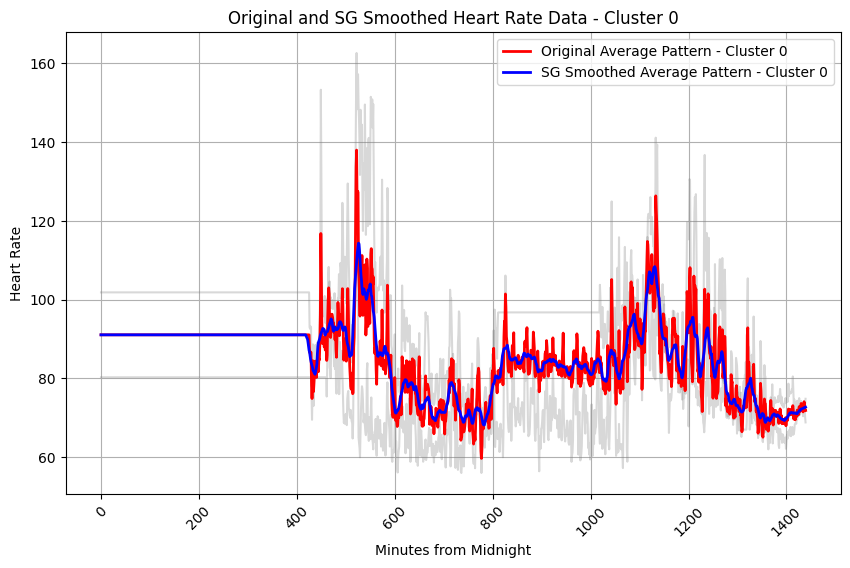

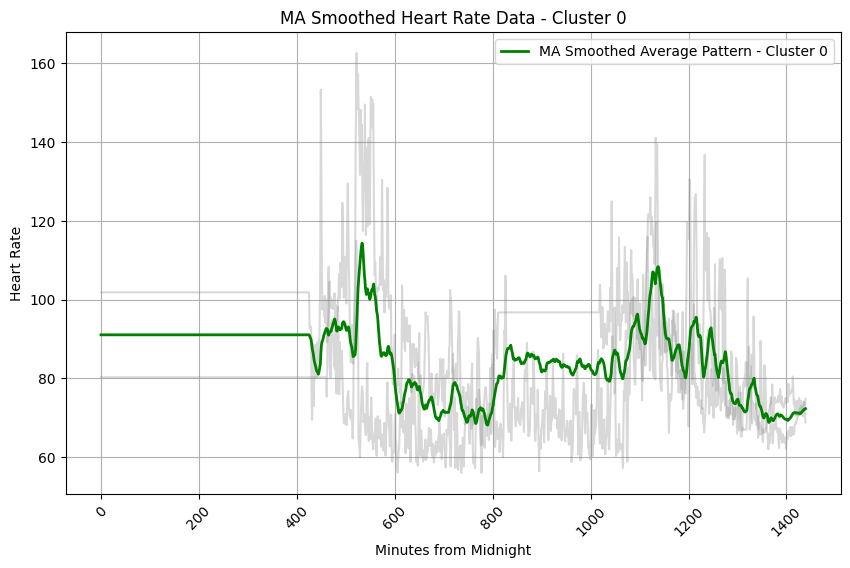

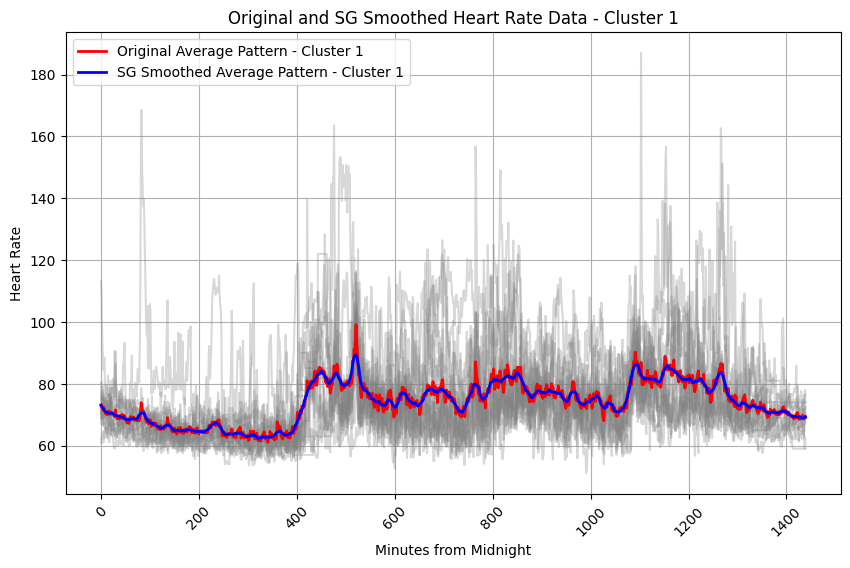

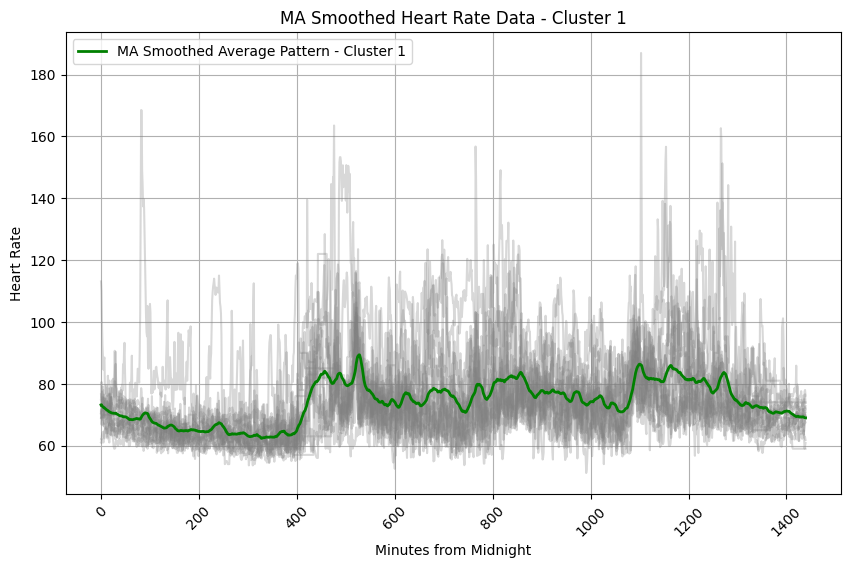

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.signal import savgol_filter

def prepare_data(file_path):
    df = pd.read_csv(file_path, parse_dates=['Time'])
    df['Date'] = df['Time'].dt.date
    df['Time_of_Day'] = df['Time'].dt.time
    participant_data = {pid: data.set_index('Time') for pid, data in df.groupby('Id')}
    return participant_data

def resample_to_full_day(data, freq='T'):
    """Resample data to have one data point per minute for the entire day."""
    return data.resample(freq).asfreq().fillna(method='ffill').fillna(method='bfill')

def cluster_participant_heart_rate_kmeans_smoothed(participant_data, participant_id, n_clusters, window_length, polyorder, random_state=0):
    if participant_id not in participant_data:
        print(f"No data found for participant ID: {participant_id}")
        return

    data = participant_data[participant_id][['Value']]

    # Resample data to have minute-by-minute values for the entire day
    data = data.groupby(data.index.date).apply(resample_to_full_day).reset_index(level=0, drop=True)

    # Resample to get daily data
    daily_data = data.resample('D').apply(lambda x: x.tolist())

    # Prepare the feature matrix
    feature_matrix = pd.DataFrame(daily_data['Value'].values.tolist(), index=daily_data.index)

    # Handle missing values by filling with the mean of each column (time of the day)
    feature_matrix.fillna(feature_matrix.mean(), inplace=True)

    # Normalize the data
    scaler = StandardScaler()
    normalized_data = scaler.fit_transform(feature_matrix)

    # Perform KMeans clustering with a fixed random state for reproducibility
    kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
    cluster_labels = kmeans.fit_predict(normalized_data)

    # Calculate clustering evaluation scores
    silhouette_avg = silhouette_score(normalized_data, cluster_labels)
    calinski_harabasz = calinski_harabasz_score(normalized_data, cluster_labels)
    davies_bouldin = davies_bouldin_score(normalized_data, cluster_labels)

    print(f"Silhouette Score: {silhouette_avg:.3f}")
    print(f"Calinski-Harabasz Index: {calinski_harabasz:.3f}")
    print(f"Davies-Bouldin Index: {davies_bouldin:.3f}")

    # Plot each cluster separately and show both original and smoothed patterns
    unique_clusters = np.unique(cluster_labels)

    # Create time labels for the x-axis covering the entire day
    time_labels = np.arange(1440)  # From 0 to 1439, representing each minute of the day

    for cluster in unique_clusters:
        plt.figure(figsize=(10, 6))
        cluster_data = feature_matrix.iloc[np.where(cluster_labels == cluster)]

        # Plot individual days
        for day in cluster_data.index:
            plt.plot(time_labels, cluster_data.loc[day], alpha=0.3, color='gray')

        # Calculate and plot the original average pattern
        mean_pattern = cluster_data.mean()
        plt.plot(time_labels, mean_pattern, label=f'Original Average Pattern - Cluster {cluster}', color='red', linewidth=2)

        # Calculate and plot the SG smoothed pattern
        sg_smoothed_pattern = savgol_filter(mean_pattern, window_length, polyorder)
        plt.plot(time_labels, sg_smoothed_pattern, label=f'SG Smoothed Average Pattern - Cluster {cluster}', color='blue', linewidth=2)

        plt.xlabel('Minutes from Midnight')
        plt.ylabel('Heart Rate')
        plt.title(f'Original and SG Smoothed Heart Rate Data - Cluster {cluster}')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.show()

        # Plot a separate figure for moving average smoothing
        plt.figure(figsize=(10, 6))

        # Plot individual days
        for day in cluster_data.index:
            plt.plot(time_labels, cluster_data.loc[day], alpha=0.3, color='gray')

        # Calculate and plot the moving average smoothed pattern
        ma_smoothed_pattern = mean_pattern.rolling(window=15, min_periods=1).mean()
        plt.plot(time_labels, ma_smoothed_pattern, label=f'MA Smoothed Average Pattern - Cluster {cluster}', color='green', linewidth=2)

        plt.xlabel('Minutes from Midnight')
        plt.ylabel('Heart Rate')
        plt.title(f'MA Smoothed Heart Rate Data - Cluster {cluster}')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.show()

# Example usage
file_path = "/content/drive/MyDrive/mturkfitbit_export_4.12.16-5.12.16/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Parameters for clustering and smoothing
participant_id = 2347167796  # Replace with your participant ID
n_clusters = 2  # Number of clusters for KMeans
window_length = 15  # Window length for SG filter
polyorder = 1  # Polynomial order for SG filter

# Perform clustering and smoothing
cluster_participant_heart_rate_kmeans_smoothed(agg_minute, participant_id, n_clusters, window_length, polyorder, random_state=0)

Seperating weekdays and weekends for visulization and find the pattern

Data starts on day: 1 (0=Monday, 6=Sunday)


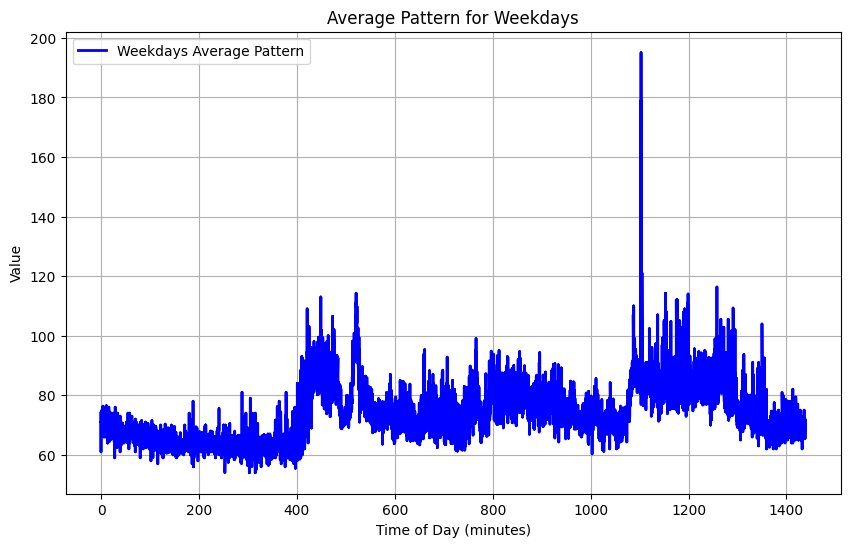

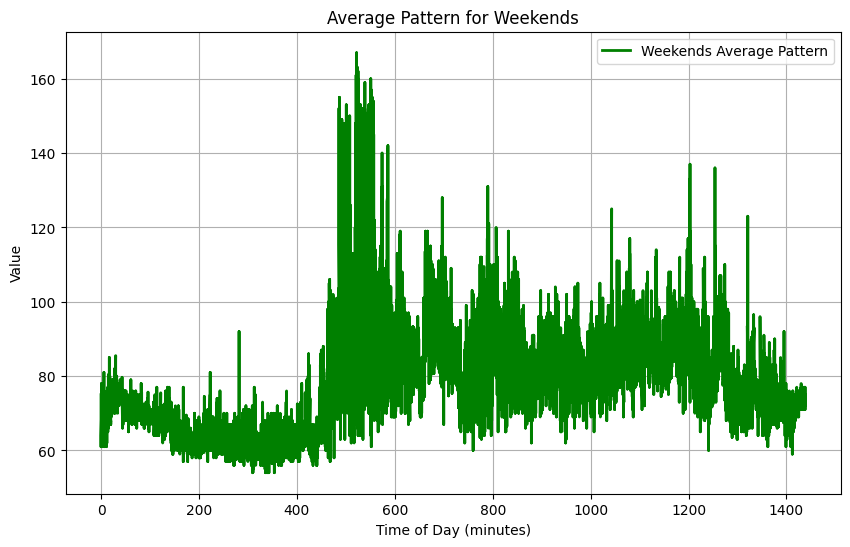

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



def plot_average_patterns(df):
    # Separate the data into weekdays and weekends
    weekdays_df = df[df.index.weekday.isin(range(0, 5))]  # Weekdays (Monday to Friday)
    weekends_df = df[df.index.weekday.isin([5, 6])]       # Weekends (Saturday, Sunday)

    # Calculate the average pattern for weekdays
    weekdays_mean_pattern = weekdays_df.groupby(weekdays_df.index.time).mean()

    # Calculate the average pattern for weekends
    weekends_mean_pattern = weekends_df.groupby(weekends_df.index.time).mean()

    # Get the unique dates for weekdays and weekends
    weekdays_dates = weekdays_df.index.normalize().unique()
    weekends_dates = weekends_df.index.normalize().unique()

    # Plot the average pattern for weekdays
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekdays_mean_pattern.index]
    plt.plot(x_values, weekdays_mean_pattern['Value'], label='Weekdays Average Pattern', color='blue', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekdays')
    plt.legend()
    plt.grid(True)

    # Annotate the plot with the dates
    for date in weekdays_dates:
        plt.annotate(date.strftime('%Y-%m-%d'), xy=(0, 0), xytext=(5, 5), textcoords='offset points', fontsize=8, alpha=0.7)

    plt.show()

    # Plot the average pattern for weekends
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekends_mean_pattern.index]
    plt.plot(x_values, weekends_mean_pattern['Value'], label='Weekends Average Pattern', color='green', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekends')
    plt.legend()
    plt.grid(True)

    # Annotate the plot with the dates
    for date in weekends_dates:
        plt.annotate(date.strftime('%Y-%m-%d'), xy=(0, 0), xytext=(5, 5), textcoords='offset points', fontsize=8, alpha=0.7)

    plt.show()

# Example usage
file_path = "/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Analyze data for a specific participant
id = 2347167796
df = participant_data[id]



# Plot average patterns for the specific participant
plot_average_patterns(df)

Get the average of each group to have a more visible pattern

Data starts on day: 1 (0=Monday, 6=Sunday)


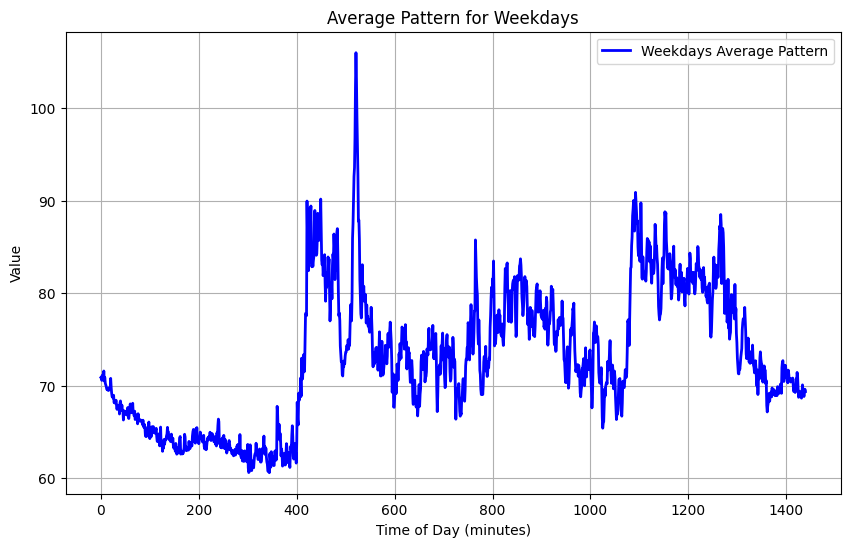

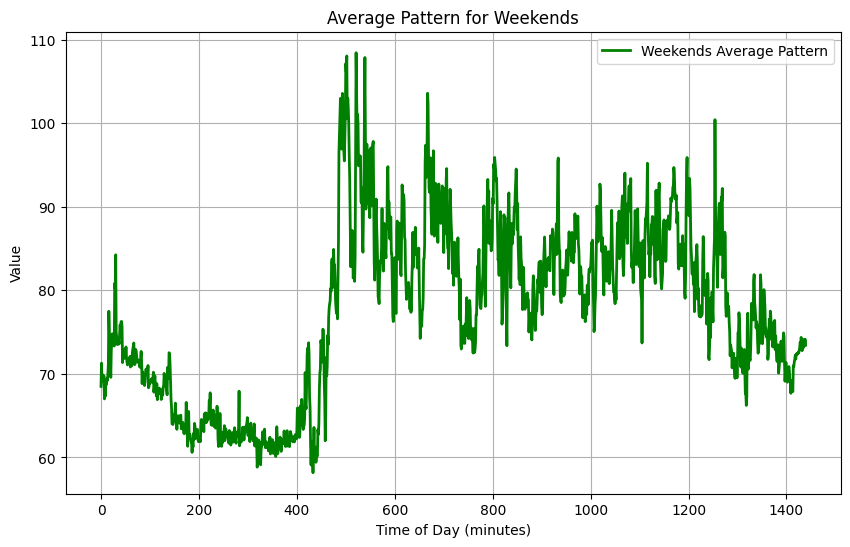

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt




def plot_average_patterns(df):
    # Separate the data into weekdays and weekends
    weekdays_df = df[df.index.weekday.isin(range(0, 5))]  # Weekdays (Monday to Friday)
    weekends_df = df[df.index.weekday.isin([5, 6])]       # Weekends (Saturday, Sunday)

    # Resample to minute-by-minute data for the entire period
    weekdays_resampled = weekdays_df['Value'].resample('T').mean()
    weekends_resampled = weekends_df['Value'].resample('T').mean()

    # Group by time of day and calculate the mean
    weekdays_mean_pattern = weekdays_resampled.groupby(weekdays_resampled.index.time).mean()
    weekends_mean_pattern = weekends_resampled.groupby(weekends_resampled.index.time).mean()

    # Plot the average pattern for weekdays
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekdays_mean_pattern.index]
    plt.plot(x_values, weekdays_mean_pattern, label='Weekdays Average Pattern', color='blue', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekdays')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot the average pattern for weekends
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekends_mean_pattern.index]
    plt.plot(x_values, weekends_mean_pattern, label='Weekends Average Pattern', color='green', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekends')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
file_path = "/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Analyze data for a specific participant
participant_id = 2347167796
df_1 = participant_data[participant_id]

# Check if the data starts from the first day of the week


# Plot average patterns for the specific participant
plot_average_patterns(df_1)


Moving average smoothing to remove the harsh fluctuation and remove the noise

Data starts on day: 1 (0=Monday, 6=Sunday)


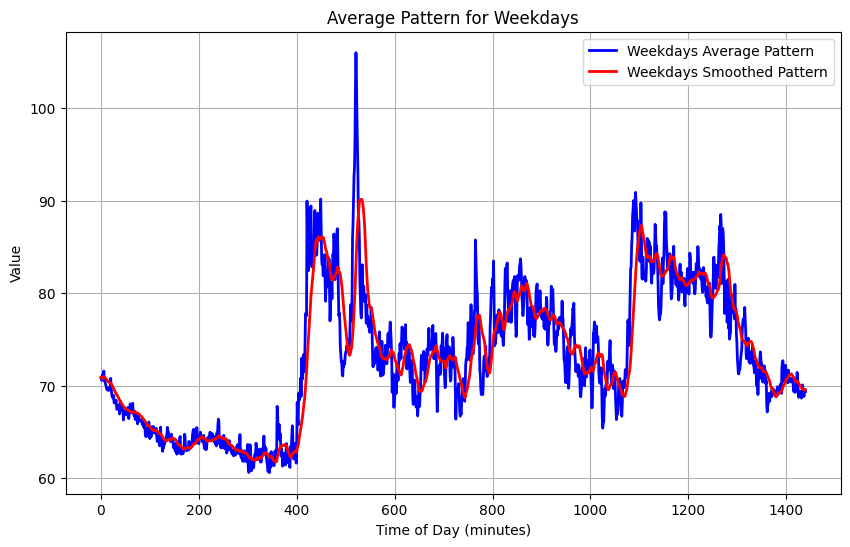

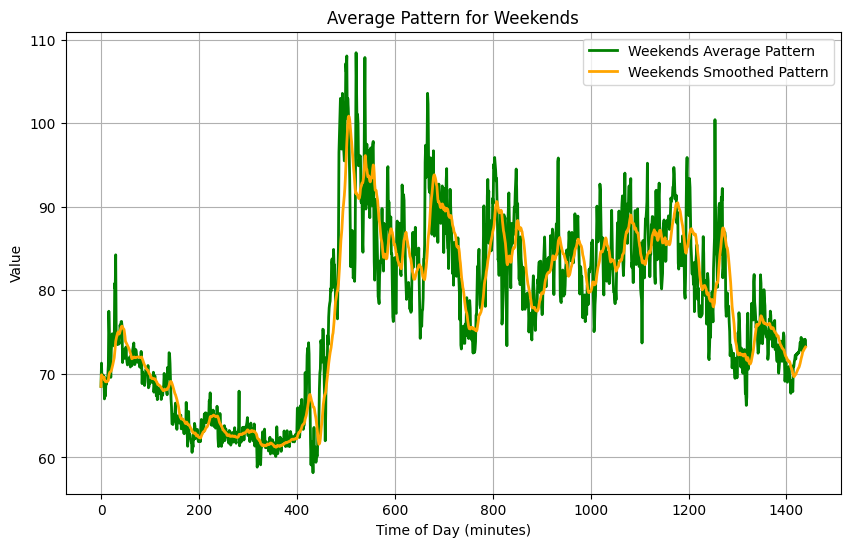

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt





def moving_average(data, window_size):
    return data.rolling(window=window_size, min_periods=1).mean()

def plot_average_patterns(df, window_size=10):
    # Separate the data into weekdays and weekends
    weekdays_df = df[df.index.weekday.isin(range(0, 5))]  # Weekdays (Monday to Friday)
    weekends_df = df[df.index.weekday.isin([5, 6])]       # Weekends (Saturday, Sunday)

    # Resample to minute-by-minute data for the entire period
    weekdays_resampled = weekdays_df['Value'].resample('T').mean()
    weekends_resampled = weekends_df['Value'].resample('T').mean()

    # Group by time of day and calculate the mean
    weekdays_mean_pattern = weekdays_resampled.groupby(weekdays_resampled.index.time).mean()
    weekends_mean_pattern = weekends_resampled.groupby(weekends_resampled.index.time).mean()

    # Apply moving average smoothing
    weekdays_smoothed = moving_average(weekdays_mean_pattern, window_size)
    weekends_smoothed = moving_average(weekends_mean_pattern, window_size)

    # Plot the average pattern for weekdays
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekdays_mean_pattern.index]
    plt.plot(x_values, weekdays_mean_pattern, label='Weekdays Average Pattern', color='blue', linewidth=2)
    plt.plot(x_values, weekdays_smoothed, label='Weekdays Smoothed Pattern', color='red', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekdays')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot the average pattern for weekends
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekends_mean_pattern.index]
    plt.plot(x_values, weekends_mean_pattern, label='Weekends Average Pattern', color='green', linewidth=2)
    plt.plot(x_values, weekends_smoothed, label='Weekends Smoothed Pattern', color='orange', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekends')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
file_path = "/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Analyze data for a specific participant
participant_id = 2347167796
df_1 = participant_data[participant_id]

# Check if the data starts from the first day of the week
check_data_start(df_1)

# Plot average patterns for the specific participant with smoothing
plot_average_patterns(df_1, window_size=20)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt



def plot_average_patterns(df):
    # Separate the data into weekdays and weekends
    weekdays_df = df[df.index.weekday.isin(range(0, 5))]  # Weekdays (Monday to Friday)
    weekends_df = df[df.index.weekday.isin([5, 6])]       # Weekends (Saturday, Sunday)

    # Resample to minute-by-minute data for the entire period
    weekdays_resampled = weekdays_df['Value'].resample('T').mean().groupby(weekdays_df.index.time).mean()
    weekends_resampled = weekends_df['Value'].resample('T').mean().groupby(weekends_df.index.time).mean()

    # Plot the average pattern for weekdays
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekdays_resampled.index]
    plt.plot(x_values, weekdays_resampled, label='Weekdays Average Pattern', color='blue', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekdays')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot the average pattern for weekends
    plt.figure(figsize=(10, 6))
    x_values = [(t.hour * 60 + t.minute) for t in weekends_resampled.index]
    plt.plot(x_values, weekends_resampled, label='Weekends Average Pattern', color='green', linewidth=2)
    plt.xlabel('Time of Day (minutes)')
    plt.ylabel('Value')
    plt.title('Average Pattern for Weekends')
    plt.legend()
    plt.grid(True)
    plt.show()

# Example usage
file_path = "/content/drive/MyDrive/Fitabase Data 4.12.16-5.12.16/heartrate_seconds_merged.csv"  # Update with your file path
participant_data = prepare_data(file_path)

# Analyze data for a specific participant
participant_id = 2347167796
df_1 = participant_data[participant_id]

# Check if the data starts from the first day of the week
check_data_start(df_1)

# Plot average patterns for the specific participant
plot_average_patterns(df_1)


Data starts on day: 1 (0=Monday, 6=Sunday)


ValueError: Grouper and axis must be same length

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

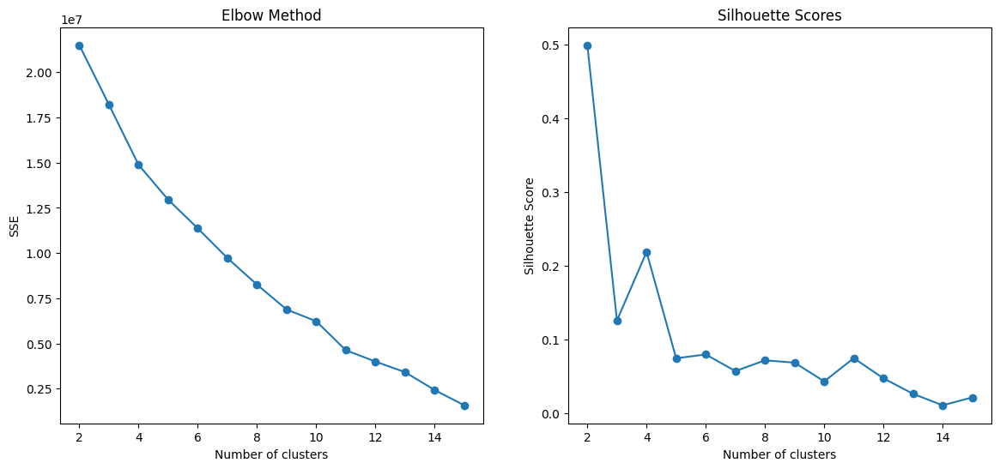

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster 0: Average missing values percentage per day: 17.92%
Cluster 1: Average missing values percentage per day: 10.80%
Silhouette Score: 0.158
Calinski-Harabasz Index: 3.193
Davies-Bouldin Index: 2.167


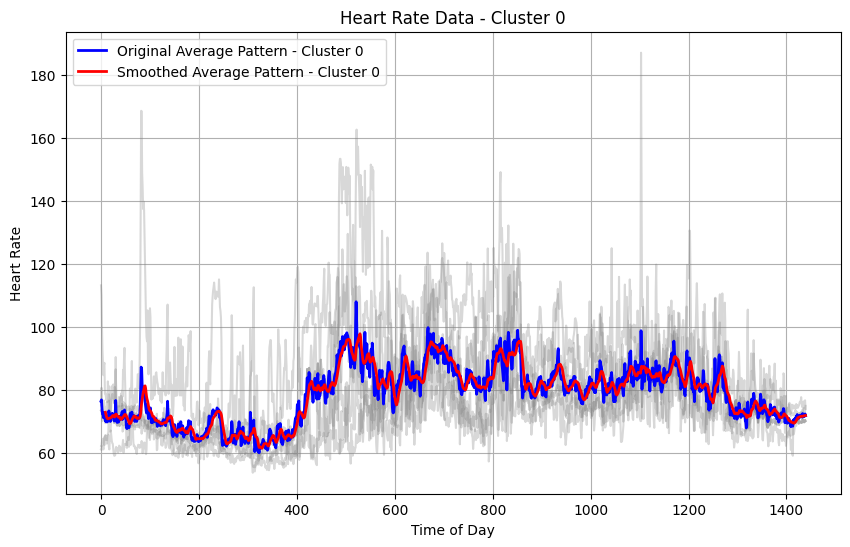

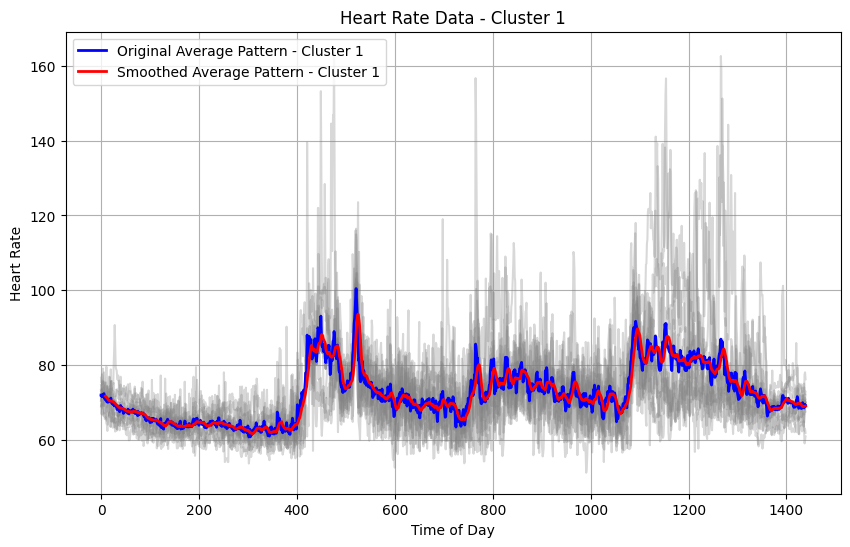

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

def moving_average(data, window_size):
    return data.rolling(window=window_size).mean()

def cluster_participant_heart_rate(participant_data, participant_id, num_clusters, window_size):
    if participant_id not in participant_data:
        print(f"No data found for participant ID: {participant_id}")
        return

    data = participant_data[participant_id][['Value']]

    # Resample to get daily data
    daily_data = data.resample('D').apply(lambda x: x.tolist())

    # Prepare the feature matrix
    feature_matrix = pd.DataFrame(daily_data['Value'].values.tolist(), index=daily_data.index)

    # Handle missing values by filling with the mean of each column (time of the day)
    feature_matrix.fillna(feature_matrix.mean(), inplace=True)

    # Normalize the data
    scaler = StandardScaler()
    normalized_data = scaler.fit_transform(feature_matrix)

    # Apply k-means clustering
    kmeans = KMeans(n_clusters=num_clusters, random_state=0)
    clusters = kmeans.fit_predict(normalized_data)

    # Add cluster labels to the feature matrix
    feature_matrix['Cluster'] = clusters

    # Calculate and print the missing percentage for each cluster
    feature_matrix_original = pd.DataFrame(daily_data['Value'].values.tolist(), index=daily_data.index)  # Original feature matrix without filling missing values
    missing_percentage_per_cluster = {}
    for cluster in range(num_clusters):
        cluster_indices = feature_matrix[feature_matrix['Cluster'] == cluster].index
        cluster_missing_percentage = feature_matrix_original.loc[cluster_indices].isna().mean().mean() * 100
        missing_percentage_per_cluster[cluster] = cluster_missing_percentage
        print(f"Cluster {cluster}: Average missing values percentage per day: {cluster_missing_percentage:.2f}%")

    # Calculate clustering evaluation scores
    silhouette_avg = silhouette_score(normalized_data, clusters)
    calinski_harabasz = calinski_harabasz_score(normalized_data, clusters)
    davies_bouldin = davies_bouldin_score(normalized_data, clusters)

    print(f"Silhouette Score: {silhouette_avg:.3f}")
    print(f"Calinski-Harabasz Index: {calinski_harabasz:.3f}")
    print(f"Davies-Bouldin Index: {davies_bouldin:.3f}")

    # Plot each cluster separately and show the average pattern
    unique_clusters = feature_matrix['Cluster'].unique()
    for cluster in unique_clusters:
        plt.figure(figsize=(10, 6))
        cluster_data = feature_matrix[feature_matrix['Cluster'] == cluster].drop('Cluster', axis=1)

        # Plot individual days
        for day in cluster_data.index:
            plt.plot(cluster_data.columns, cluster_data.loc[day], alpha=0.3, color='gray')

        # Plot original average pattern
        mean_pattern = cluster_data.mean()
        plt.plot(mean_pattern.index, mean_pattern.values, label=f'Original Average Pattern - Cluster {cluster}', color='blue', linewidth=2)

        # Smooth the average pattern
        smoothed_pattern = moving_average(mean_pattern, window_size)
        plt.plot(smoothed_pattern.index, smoothed_pattern.values, label=f'Smoothed Average Pattern - Cluster {cluster}', color='red', linewidth=2)

        plt.xlabel('Time of Day')
        plt.ylabel('Heart Rate')
        plt.title(f'Heart Rate Data - Cluster {cluster}')
        plt.legend()
        plt.grid(True)
        plt.show()

# Example usage
# Assuming you have already loaded and prepared your participant data
# participant_data = ... (your existing participant data)
# optimal_num_clusters = ... (the optimal number of clusters you found)
participant_id = 2347167796  # Replace with your participant ID
optimal_num_clusters = 2 # Replace with the optimal number of clusters you found
window_size = 10  # Choose the window size for moving average smoothing

# Cluster data for a specific participant
cluster_participant_heart_rate(agg_minute, participant_id, optimal_num_clusters, window_size)